In [46]:
import os
import cv2
import pandas as pd
import random
import numpy as np
from PIL import Image
import logging
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import tensorflow as tf
import torch

from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score
from sklearn.model_selection import train_test_split

from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Dense, Input, Conv2D, GlobalAveragePooling2D, Flatten, MaxPooling2D, AveragePooling2D, Concatenate, Dropout, Reshape
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.metrics import AUC


from deepface import DeepFace
from transformers import CLIPProcessor, CLIPModel

In [28]:
# Paths
image_folder = 'WFLW_images'
output_folder = 'aligned_results'
annotation_file = 'WFLW_annotations/list_98pt_rect_attr_train_test/list_98pt_rect_attr_train.txt'
test_annotation_file = 'WFLW_annotations/list_98pt_rect_attr_train_test/list_98pt_rect_attr_test.txt'
augmented_folder = 'augmented_results'  
transformed_folder = 'transformed_data'

# Landmark alignment

In [30]:
def load_annotations(file_path):
    """ 
    Load annotations from the text file. This function accesses a text file of facial landmarks 
    and attributes using the provided file path. Each line in the file contains data for one image, 
    including landmarks, attributes, and bounding box coordinates, which are processed and organized 
    into a DataFrame for further use.
    
    Args:
        file_path (str): Path to the annotations file.
    
    Returns:
        pd.DataFrame: DataFrame containing the annotations.
    """
    data = pd.read_csv(file_path, sep='\s+', header=None)  # Read data from the file assuming space-separated values.
    num_coords = 196  # Number of numerical entries dedicated to landmark coordinates (x and y for 98 points).
    num_rect_coords = 4  # Number of values representing the bounding box coordinates.

    # Extract image names and attribute columns based on predefined indices.
    data['image_name'] = data.iloc[:, num_coords + num_rect_coords + 6].values
    attributes_columns = num_coords + num_rect_coords + np.arange(6)  # Indices for six attribute columns.
    data['pose'] = data.iloc[:, attributes_columns[0]].values
    data['expression'] = data.iloc[:, attributes_columns[1]].values
    data['illumination'] = data.iloc[:, attributes_columns[2]].values
    data['make-up'] = data.iloc[:, attributes_columns[3]].values
    data['occlusion'] = data.iloc[:, attributes_columns[4]].values
    data['blur'] = data.iloc[:, attributes_columns[5]].values

    # Extract bounding box coordinates based on predefined indices.
    rect_columns = num_coords + np.arange(num_rect_coords)  # Indices for bounding box coordinates.
    data['x_min_rect'] = data.iloc[:, rect_columns[0]].values
    data['y_min_rect'] = data.iloc[:, rect_columns[1]].values
    data['x_max_rect'] = data.iloc[:, rect_columns[2]].values
    data['y_max_rect'] = data.iloc[:, rect_columns[3]].values

    return data

def preprocess_images(data, image_folder, output_folder):
    """ 
    Preprocess images by cropping faces based on bounding box coordinates and saving them.
    
    Args:
        data (pd.DataFrame): DataFrame containing image names and bounding box coordinates.
        image_folder (str): Path to the folder containing the original images.
        output_folder (str): Path to the folder where processed images will be saved.
    """
    for idx, row in data.iterrows():
        image_path = os.path.join(image_folder, row['image_name'])
        image = cv2.imread(image_path)
        if image is not None:
            x_min = row['x_min_rect']
            y_min = row['y_min_rect']
            x_max = row['x_max_rect']
            y_max = row['y_max_rect']
            face = image[int(y_min):int(y_max), int(x_min):int(x_max)]
            output_path = os.path.join(output_folder, row['image_name'].split('/')[-1])
            if face.size > 0:
                face_RGB = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB.
                img = Image.fromarray(face_RGB)  # Convert the array into an image object.
                img.save(output_path)  # Save the image object to the specified directory.
                print(f"Cropped face saved to {output_path}")
        else:
            print(f"Image not found: {image_path}")

def split_data(data, test_size=0.2):
    """ 
    Split the data into training and validation sets based on the specified test size proportion.
    
    Args:
        data (pd.DataFrame): DataFrame containing the annotations and attributes.
        test_size (float): Proportion of the data to be used as validation set.
    
    Returns:
        tuple: Training and validation DataFrames.
    """
    train_data, val_data = train_test_split(data, test_size=test_size, random_state=42)
    return train_data, val_data

# Ensure the output folder exists
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Load and preprocess training and validation data
data = load_annotations(annotation_file)
train_data, val_data = split_data(data)
preprocess_images(train_data, image_folder, output_folder)
preprocess_images(val_data, image_folder, output_folder)

# Load and preprocess test data
test_data = load_annotations(test_annotation_file)
preprocess_images(test_data, image_folder, output_folder)

# Save the train, validation, and test data with attributes
train_data.to_csv('train_data.csv', index=False)
val_data.to_csv('val_data.csv', index=False)
test_data.to_csv('test_data.csv', index=False)

print("Preprocessing complete.")


Cropped face saved to aligned_results/41_Swimming_Swimmer_41_688.jpg
Cropped face saved to aligned_results/2_Demonstration_Demonstration_Or_Protest_2_315.jpg
Cropped face saved to aligned_results/44_Aerobics_Aerobics_44_848.jpg
Cropped face saved to aligned_results/12_Group_Group_12_Group_Group_12_186.jpg
Cropped face saved to aligned_results/26_Soldier_Drilling_Soldiers_Drilling_26_883.jpg
Cropped face saved to aligned_results/40_Gymnastics_Gymnastics_40_280.jpg
Cropped face saved to aligned_results/32_Worker_Laborer_Worker_Laborer_32_139.jpg
Cropped face saved to aligned_results/51_Dresses_wearingdress_51_670.jpg
Cropped face saved to aligned_results/23_Shoppers_Shoppers_23_583.jpg
Cropped face saved to aligned_results/16_Award_Ceremony_Awards_Ceremony_16_525.jpg
Cropped face saved to aligned_results/31_Waiter_Waitress_Waiter_Waitress_31_81.jpg
Cropped face saved to aligned_results/41_Swimming_Swimming_41_769.jpg
Cropped face saved to aligned_results/44_Aerobics_Aerobics_44_128.jpg
C

Cropped face saved to /Users/shima/Downloads/algaFace/results/36--Football/36_Football_americanfootball_ball_36_396.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/54--Rescue/54_Rescue_firemanrescue_54_672.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/8--Election_Campain/8_Election_Campain_Election_Campaign_8_313.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/43--Row_Boat/43_Row_Boat_Rowboat_43_783.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/13--Interview/13_Interview_Interview_2_People_Visible_13_130.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/41--Swimming/41_Swimming_Swimmer_41_262.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/13--Interview/13_Interview_Interview_On_Location_13_710.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Political_Rally_2_335.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results

Cropped face saved to /Users/shima/Downloads/algaFace/results/20--Family_Group/20_Family_Group_Family_Group_20_510.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/16--Award_Ceremony/16_Award_Ceremony_Awards_Ceremony_16_397.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/57--Angler/57_Angler_peoplefishing_57_280.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/42--Car_Racing/42_Car_Racing_Nascar_42_624.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/0--Parade/0_Parade_Parade_0_471.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/18--Concerts/18_Concerts_Concerts_18_502.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Large_Group_12_Group_Large_Group_12_595.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/32--Worker_Laborer/32_Worker_Laborer_Worker_Laborer_32_725.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/30--Surgeons/30_Surge

Cropped face saved to /Users/shima/Downloads/algaFace/results/26--Soldier_Drilling/26_Soldier_Drilling_Soldiers_Drilling_26_440.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Demonstration_Or_Protest_2_415.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/40--Gymnastics/40_Gymnastics_Gymnastics_40_484.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/59--people--driving--car/59_peopledrivingcar_peopledrivingcar_59_90.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/35--Basketball/35_Basketball_playingbasketball_35_334.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Demonstration_Or_Protest_2_757.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/14--Traffic/14_Traffic_Traffic_14_620.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/52--Photographers/52_Photographers_taketouristphotos_52_24.jpg
Cropped face

Cropped face saved to /Users/shima/Downloads/algaFace/results/17--Ceremony/17_Ceremony_Ceremony_17_553.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/53--Raid/53_Raid_policeraid_53_35.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/44--Aerobics/44_Aerobics_Aerobics_44_35.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/13--Interview/13_Interview_Interview_Sequences_13_858.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/13--Interview/13_Interview_Interview_Sequences_13_288.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/7--Cheering/7_Cheering_Cheering_7_350.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/9--Press_Conference/9_Press_Conference_Press_Conference_9_176.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/13--Interview/13_Interview_Interview_2_People_Visible_13_427.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/23--Shoppers/23_Shoppers_S

Cropped face saved to /Users/shima/Downloads/algaFace/results/17--Ceremony/17_Ceremony_Ceremony_17_437.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Large_Group_12_Group_Large_Group_12_27.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/26--Soldier_Drilling/26_Soldier_Drilling_Soldiers_Drilling_26_691.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/57--Angler/57_Angler_peoplefishing_57_442.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/57--Angler/57_Angler_peoplefishing_57_544.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Group_12_Group_Group_12_155.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/13--Interview/13_Interview_Interview_On_Location_13_126.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/23--Shoppers/23_Shoppers_Shoppers_23_63.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/29--Students_Schoo

Cropped face saved to /Users/shima/Downloads/algaFace/results/18--Concerts/18_Concerts_Concerts_18_600.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/39--Ice_Skating/39_Ice_Skating_Ice_Skating_39_778.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Group_12_Group_Group_12_728.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Demonstration_Or_Protest_2_947.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/20--Family_Group/20_Family_Group_Family_Group_20_579.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/11--Meeting/11_Meeting_Meeting_11_Meeting_Meeting_11_77.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/44--Aerobics/44_Aerobics_Aerobics_44_652.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/17--Ceremony/17_Ceremony_Ceremony_17_171.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/7--Cheering/7_Che

Cropped face saved to /Users/shima/Downloads/algaFace/results/51--Dresses/51_Dresses_wearingdress_51_65.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/39--Ice_Skating/39_Ice_Skating_Ice_Skating_39_616.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/0--Parade/0_Parade_marchingband_1_1015.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/9--Press_Conference/9_Press_Conference_Press_Conference_9_604.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/4--Dancing/4_Dancing_Dancing_4_702.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/25--Soldier_Patrol/25_Soldier_Patrol_Soldier_Patrol_25_661.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Team_Organized_Group_12_Group_Team_Organized_Group_12_602.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/7--Cheering/7_Cheering_Cheering_7_16.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/30--Surge

Cropped face saved to /Users/shima/Downloads/algaFace/results/19--Couple/19_Couple_Couple_19_933.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/56--Voter/56_Voter_peoplevoting_56_259.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/3--Riot/3_Riot_Riot_3_460.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/47--Matador_Bullfighter/47_Matador_Bullfighter_Matador_Bullfighter_47_579.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/50--Celebration_Or_Party/50_Celebration_Or_Party_houseparty_50_9.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/7--Cheering/7_Cheering_Cheering_7_101.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Protesters_2_738.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/23--Shoppers/23_Shoppers_Shoppers_23_503.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/20--Family_Group/20_Family_Group_Family_Gr

Cropped face saved to /Users/shima/Downloads/algaFace/results/5--Car_Accident/5_Car_Accident_Car_Crash_5_498.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/4--Dancing/4_Dancing_Dancing_4_1029.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/38--Tennis/38_Tennis_Tennis_38_483.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/51--Dresses/51_Dresses_wearingdress_51_171.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/16--Award_Ceremony/16_Award_Ceremony_Awards_Ceremony_16_126.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/19--Couple/19_Couple_Couple_19_650.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/20--Family_Group/20_Family_Group_Family_Group_20_136.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/31--Waiter_Waitress/31_Waiter_Waitress_Waiter_Waitress_31_482.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/31--Waiter_Waitress/31_Waiter_Waitress_

Cropped face saved to /Users/shima/Downloads/algaFace/results/59--people--driving--car/59_peopledrivingcar_peopledrivingcar_59_76.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Group_12_Group_Group_12_2.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/13--Interview/13_Interview_Interview_On_Location_13_862.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/45--Balloonist/45_Balloonist_Balloonist_45_465.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Protesters_2_836.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/31--Waiter_Waitress/31_Waiter_Waitress_Waiter_Waitress_31_64.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/20--Family_Group/20_Family_Group_Family_Group_20_807.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/44--Aerobics/44_Aerobics_Aerobics_44_752.jpg
Cropped face saved to /Users/shima/Downloads/algaFa

Cropped face saved to /Users/shima/Downloads/algaFace/results/30--Surgeons/30_Surgeons_Surgeons_30_264.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/30--Surgeons/30_Surgeons_Surgeons_30_522.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/7--Cheering/7_Cheering_Cheering_7_607.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Protesters_2_307.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/0--Parade/0_Parade_Parade_0_271.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/50--Celebration_Or_Party/50_Celebration_Or_Party_birthdayparty_50_396.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/46--Jockey/46_Jockey_Jockey_46_222.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/54--Rescue/54_Rescue_rescuepeople_54_529.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/37--Soccer/37_Soccer_Soccer_37_781.jpg
Cropped face saved to /

Cropped face saved to /Users/shima/Downloads/algaFace/results/4--Dancing/4_Dancing_Dancing_4_954.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/55--Sports_Coach_Trainer/55_Sports_Coach_Trainer_sportcoaching_55_746.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/30--Surgeons/30_Surgeons_Surgeons_30_984.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/30--Surgeons/30_Surgeons_Surgeons_30_8.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Group_12_Group_Group_12_300.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/16--Award_Ceremony/16_Award_Ceremony_Awards_Ceremony_16_485.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/50--Celebration_Or_Party/50_Celebration_Or_Party_houseparty_50_775.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/41--Swimming/41_Swimming_Swimmer_41_503.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/20--Family_

Cropped face saved to /Users/shima/Downloads/algaFace/results/14--Traffic/14_Traffic_Traffic_14_939.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/18--Concerts/18_Concerts_Concerts_18_763.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/41--Swimming/41_Swimming_Swimmer_41_770.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/1--Handshaking/1_Handshaking_Handshaking_1_174.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/55--Sports_Coach_Trainer/55_Sports_Coach_Trainer_sportcoaching_55_498.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/28--Sports_Fan/28_Sports_Fan_Sports_Fan_28_55.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Political_Rally_2_83.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/50--Celebration_Or_Party/50_Celebration_Or_Party_houseparty_50_763.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/16--Awa

Cropped face saved to /Users/shima/Downloads/algaFace/results/30--Surgeons/30_Surgeons_Surgeons_30_924.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Demonstration_Or_Protest_2_494.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/38--Tennis/38_Tennis_Tennis_38_501.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/7--Cheering/7_Cheering_Cheering_7_547.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/7--Cheering/7_Cheering_Cheering_7_16.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/20--Family_Group/20_Family_Group_Family_Group_20_750.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/40--Gymnastics/40_Gymnastics_Gymnastics_40_153.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Political_Rally_2_335.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/52--Photographers/52_Photographers_photo

Cropped face saved to /Users/shima/Downloads/algaFace/results/18--Concerts/18_Concerts_Concerts_18_63.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/36--Football/36_Football_americanfootball_ball_36_456.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/38--Tennis/38_Tennis_Tennis_38_163.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/44--Aerobics/44_Aerobics_Aerobics_44_156.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/50--Celebration_Or_Party/50_Celebration_Or_Party_birthdayparty_50_322.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/51--Dresses/51_Dresses_wearingdress_51_984.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/34--Baseball/34_Baseball_Baseball_34_90.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/35--Basketball/35_Basketball_playingbasketball_35_810.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/9--Press_Conference/9_Press_Confe

Cropped face saved to /Users/shima/Downloads/algaFace/results/46--Jockey/46_Jockey_Jockey_46_276.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/15--Stock_Market/15_Stock_Market_Stock_Market_15_635.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Demonstration_Or_Protest_2_455.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/13--Interview/13_Interview_Interview_2_People_Visible_13_397.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/13--Interview/13_Interview_Interview_On_Location_13_1025.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/44--Aerobics/44_Aerobics_Aerobics_44_346.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Political_Rally_2_137.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/52--Photographers/52_Photographers_photographertakingphoto_52_247.jpg
Cropped face saved to /Users/shima/Downl

Cropped face saved to /Users/shima/Downloads/algaFace/results/50--Celebration_Or_Party/50_Celebration_Or_Party_houseparty_50_33.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/35--Basketball/35_Basketball_basketballgame_ball_35_802.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/55--Sports_Coach_Trainer/55_Sports_Coach_Trainer_sportcoaching_55_680.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/9--Press_Conference/9_Press_Conference_Press_Conference_9_849.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/1--Handshaking/1_Handshaking_Handshaking_1_801.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/15--Stock_Market/15_Stock_Market_Stock_Market_15_475.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/50--Celebration_Or_Party/50_Celebration_Or_Party_houseparty_50_947.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Team_Organized_Group_12_Group_Team_O

Cropped face saved to /Users/shima/Downloads/algaFace/results/44--Aerobics/44_Aerobics_Aerobics_44_610.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/17--Ceremony/17_Ceremony_Ceremony_17_207.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/18--Concerts/18_Concerts_Concerts_18_922.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/39--Ice_Skating/39_Ice_Skating_iceskiing_39_530.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/55--Sports_Coach_Trainer/55_Sports_Coach_Trainer_sportcoaching_55_388.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/47--Matador_Bullfighter/47_Matador_Bullfighter_matadorbullfighting_47_657.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Demonstration_Or_Protest_2_276.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/39--Ice_Skating/39_Ice_Skating_Ice_Skating_39_304.jpg
Cropped face saved to /Users/shima/Download

Cropped face saved to /Users/shima/Downloads/algaFace/results/11--Meeting/11_Meeting_Meeting_11_Meeting_Meeting_11_710.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/44--Aerobics/44_Aerobics_Aerobics_44_762.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/17--Ceremony/17_Ceremony_Ceremony_17_182.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/41--Swimming/41_Swimming_Swimmer_41_274.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/61--Street_Battle/61_Street_Battle_streetfight_61_660.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/19--Couple/19_Couple_Couple_19_369.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/36--Football/36_Football_americanfootball_ball_36_578.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Group_12_Group_Group_12_286.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/4--Dancing/4_Dancing_Dancing_4_718.jpg
Cr

Cropped face saved to /Users/shima/Downloads/algaFace/results/55--Sports_Coach_Trainer/55_Sports_Coach_Trainer_sportcoaching_55_365.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/18--Concerts/18_Concerts_Concerts_18_522.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/32--Worker_Laborer/32_Worker_Laborer_Worker_Laborer_32_136.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/30--Surgeons/30_Surgeons_Surgeons_30_261.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/47--Matador_Bullfighter/47_Matador_Bullfighter_Matador_Bullfighter_47_132.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/53--Raid/53_Raid_policeraid_53_282.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/28--Sports_Fan/28_Sports_Fan_Sports_Fan_28_55.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/25--Soldier_Patrol/25_Soldier_Patrol_Soldier_Patrol_25_1018.jpg
Cropped face saved to /Users/shima/Downloads/a

Cropped face saved to /Users/shima/Downloads/algaFace/results/4--Dancing/4_Dancing_Dancing_4_459.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/29--Students_Schoolkids/29_Students_Schoolkids_Students_Schoolkids_29_379.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/3--Riot/3_Riot_Riot_3_302.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/9--Press_Conference/9_Press_Conference_Press_Conference_9_828.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Political_Rally_2_687.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Demonstrators_2_381.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/9--Press_Conference/9_Press_Conference_Press_Conference_9_795.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Protesters_2_56.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/re

Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Political_Rally_2_978.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/30--Surgeons/30_Surgeons_Surgeons_30_568.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/19--Couple/19_Couple_Couple_19_340.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Group_12_Group_Group_12_261.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/13--Interview/13_Interview_Interview_Sequences_13_339.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/49--Greeting/49_Greeting_peoplegreeting_49_456.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/20--Family_Group/20_Family_Group_Family_Group_20_380.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/10--People_Marching/10_People_Marching_People_Marching_2_307.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/

Cropped face saved to /Users/shima/Downloads/algaFace/results/13--Interview/13_Interview_Interview_Sequences_13_372.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/28--Sports_Fan/28_Sports_Fan_Sports_Fan_28_514.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/7--Cheering/7_Cheering_Cheering_7_81.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/20--Family_Group/20_Family_Group_Family_Group_20_200.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/55--Sports_Coach_Trainer/55_Sports_Coach_Trainer_sportcoaching_55_138.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/35--Basketball/35_Basketball_playingbasketball_35_851.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/0--Parade/0_Parade_Parade_0_178.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/10--People_Marching/10_People_Marching_People_Marching_2_1021.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/6

Cropped face saved to /Users/shima/Downloads/algaFace/results/35--Basketball/35_Basketball_Basketball_35_828.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/14--Traffic/14_Traffic_Traffic_14_325.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/19--Couple/19_Couple_Couple_19_771.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/61--Street_Battle/61_Street_Battle_streetfight_61_941.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/47--Matador_Bullfighter/47_Matador_Bullfighter_Matador_Bullfighter_47_658.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/20--Family_Group/20_Family_Group_Family_Group_20_173.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/5--Car_Accident/5_Car_Accident_Car_Crash_5_823.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/59--people--driving--car/59_peopledrivingcar_peopledrivingcar_59_427.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/r

Cropped face saved to /Users/shima/Downloads/algaFace/results/28--Sports_Fan/28_Sports_Fan_Sports_Fan_28_959.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/7--Cheering/7_Cheering_Cheering_7_484.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/49--Greeting/49_Greeting_peoplegreeting_49_344.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/3--Riot/3_Riot_Riot_3_707.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/35--Basketball/35_Basketball_basketballgame_ball_35_201.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Political_Rally_2_173.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/15--Stock_Market/15_Stock_Market_Stock_Market_15_1002.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/24--Soldier_Firing/24_Soldier_Firing_Soldier_Firing_24_536.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Group_12_

Cropped face saved to /Users/shima/Downloads/algaFace/results/29--Students_Schoolkids/29_Students_Schoolkids_Students_Schoolkids_29_601.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/57--Angler/57_Angler_peoplefishing_57_464.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Group_12_Group_Group_12_277.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/20--Family_Group/20_Family_Group_Family_Group_20_104.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/35--Basketball/35_Basketball_basketballgame_ball_35_153.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/5--Car_Accident/5_Car_Accident_Car_Crash_5_575.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/48--Parachutist_Paratrooper/48_Parachutist_Paratrooper_Parachutist_Paratrooper_48_892.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/26--Soldier_Drilling/26_Soldier_Drilling_Soldiers_Drilling_26_568.jpg
C

Cropped face saved to /Users/shima/Downloads/algaFace/results/44--Aerobics/44_Aerobics_Aerobics_44_379.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/18--Concerts/18_Concerts_Concerts_18_912.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/15--Stock_Market/15_Stock_Market_Stock_Market_15_779.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/31--Waiter_Waitress/31_Waiter_Waitress_Waiter_Waitress_31_200.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/0--Parade/0_Parade_Parade_0_926.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/9--Press_Conference/9_Press_Conference_Press_Conference_9_821.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Protesters_2_815.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/56--Voter/56_Voter_peoplevoting_56_205.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/45--Balloonist/45_Balloonist_B

Cropped face saved to /Users/shima/Downloads/algaFace/results/35--Basketball/35_Basketball_basketballgame_ball_35_705.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/51--Dresses/51_Dresses_wearingdress_51_7.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/54--Rescue/54_Rescue_rescuepeople_54_560.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/20--Family_Group/20_Family_Group_Family_Group_20_360.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/46--Jockey/46_Jockey_Jockey_46_659.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/4--Dancing/4_Dancing_Dancing_4_189.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/47--Matador_Bullfighter/47_Matador_Bullfighter_Matador_Bullfighter_47_655.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/57--Angler/57_Angler_peoplefishing_57_1012.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/20--Family_Group/20_Family_Group

Cropped face saved to /Users/shima/Downloads/algaFace/results/1--Handshaking/1_Handshaking_Handshaking_1_678.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/9--Press_Conference/9_Press_Conference_Press_Conference_9_345.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/0--Parade/0_Parade_Parade_0_616.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/46--Jockey/46_Jockey_Jockey_46_716.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/59--people--driving--car/59_peopledrivingcar_peopledrivingcar_59_244.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/35--Basketball/35_Basketball_Basketball_35_514.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/51--Dresses/51_Dresses_wearingdress_51_548.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/3--Riot/3_Riot_Riot_3_571.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/47--Matador_Bullfighter/47_Matador_Bullfighter_Ma

Cropped face saved to /Users/shima/Downloads/algaFace/results/50--Celebration_Or_Party/50_Celebration_Or_Party_houseparty_50_321.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/18--Concerts/18_Concerts_Concerts_18_640.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/3--Riot/3_Riot_Riot_3_587.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/37--Soccer/37_Soccer_soccer_ball_37_543.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/30--Surgeons/30_Surgeons_Surgeons_30_739.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/54--Rescue/54_Rescue_rescuepeople_54_395.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Protesters_2_542.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/52--Photographers/52_Photographers_photographertakingphoto_52_789.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Polit

Cropped face saved to /Users/shima/Downloads/algaFace/results/0--Parade/0_Parade_Parade_0_773.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Demonstration_Or_Protest_2_332.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Large_Group_12_Group_Large_Group_12_535.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/35--Basketball/35_Basketball_Basketball_35_440.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/57--Angler/57_Angler_peoplefishing_57_803.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/55--Sports_Coach_Trainer/55_Sports_Coach_Trainer_sportcoaching_55_55.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/51--Dresses/51_Dresses_wearingdress_51_79.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/47--Matador_Bullfighter/47_Matador_Bullfighter_matadorbullfighting_47_781.jpg
Cropped face saved to /Users/shima/Download

Cropped face saved to /Users/shima/Downloads/algaFace/results/13--Interview/13_Interview_Interview_Sequences_13_962.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/55--Sports_Coach_Trainer/55_Sports_Coach_Trainer_sportcoaching_55_821.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/31--Waiter_Waitress/31_Waiter_Waitress_Waiter_Waitress_31_188.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Political_Rally_2_791.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/31--Waiter_Waitress/31_Waiter_Waitress_Waiter_Waitress_31_640.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/29--Students_Schoolkids/29_Students_Schoolkids_Students_Schoolkids_29_19.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Demonstrators_2_373.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/3--Riot/3_Riot_Riot_3_860.jpg
Cropped face save

Cropped face saved to /Users/shima/Downloads/algaFace/results/24--Soldier_Firing/24_Soldier_Firing_Soldier_Firing_24_703.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/46--Jockey/46_Jockey_Jockey_46_803.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/13--Interview/13_Interview_Interview_Sequences_13_555.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/15--Stock_Market/15_Stock_Market_Stock_Market_15_362.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/47--Matador_Bullfighter/47_Matador_Bullfighter_Matador_Bullfighter_47_112.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/1--Handshaking/1_Handshaking_Handshaking_1_94.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/0--Parade/0_Parade_Parade_0_960.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Group_12_Group_Group_12_144.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/20--Family

Cropped face saved to /Users/shima/Downloads/algaFace/results/30--Surgeons/30_Surgeons_Surgeons_30_328.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/8--Election_Campain/8_Election_Campain_Election_Campaign_8_159.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/32--Worker_Laborer/32_Worker_Laborer_Worker_Laborer_32_57.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/25--Soldier_Patrol/25_Soldier_Patrol_Soldier_Patrol_25_687.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/8--Election_Campain/8_Election_Campain_Election_Campaign_8_334.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/35--Basketball/35_Basketball_basketballgame_ball_35_515.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/54--Rescue/54_Rescue_rescuepeople_54_658.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/57--Angler/57_Angler_peoplefishing_57_965.jpg
Cropped face saved to /Users/shima/Downloads/alga

Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Team_Organized_Group_12_Group_Team_Organized_Group_12_274.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/35--Basketball/35_Basketball_basketballgame_ball_35_412.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/0--Parade/0_Parade_Parade_0_364.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Large_Group_12_Group_Large_Group_12_235.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/13--Interview/13_Interview_Interview_On_Location_13_728.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/56--Voter/56_Voter_peoplevoting_56_988.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/40--Gymnastics/40_Gymnastics_Gymnastics_40_623.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Political_Rally_2_545.jpg
Cropped face saved to /Users/shima/Downloads/algaFa

Cropped face saved to /Users/shima/Downloads/algaFace/results/35--Basketball/35_Basketball_basketballgame_ball_35_926.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/29--Students_Schoolkids/29_Students_Schoolkids_Students_Schoolkids_29_732.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Large_Group_12_Group_Large_Group_12_493.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/29--Students_Schoolkids/29_Students_Schoolkids_Students_Schoolkids_29_506.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/51--Dresses/51_Dresses_wearingdress_51_550.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/45--Balloonist/45_Balloonist_Balloonist_45_225.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/8--Election_Campain/8_Election_Campain_Election_Campaign_8_563.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/50--Celebration_Or_Party/50_Celebration_Or_Party_houseparty_

Cropped face saved to /Users/shima/Downloads/algaFace/results/31--Waiter_Waitress/31_Waiter_Waitress_Waiter_Waitress_31_339.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/20--Family_Group/20_Family_Group_Family_Group_20_387.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/11--Meeting/11_Meeting_Meeting_11_Meeting_Meeting_11_102.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/16--Award_Ceremony/16_Award_Ceremony_Awards_Ceremony_16_56.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Political_Rally_2_22.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/56--Voter/56_Voter_peoplevoting_56_924.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/28--Sports_Fan/28_Sports_Fan_Sports_Fan_28_867.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/58--Hockey/58_Hockey_icehockey_puck_58_655.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/resu

Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Group_12_Group_Group_12_1019.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/49--Greeting/49_Greeting_peoplegreeting_49_844.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/55--Sports_Coach_Trainer/55_Sports_Coach_Trainer_sportcoaching_55_801.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/9--Press_Conference/9_Press_Conference_Press_Conference_9_490.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/10--People_Marching/10_People_Marching_People_Marching_10_People_Marching_People_Marching_10_People_Marching_People_Marching_10_921.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/46--Jockey/46_Jockey_Jockey_46_8.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/13--Interview/13_Interview_Interview_On_Location_13_933.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/50--Celebration_Or_Party/50_

Cropped face saved to /Users/shima/Downloads/algaFace/results/31--Waiter_Waitress/31_Waiter_Waitress_Waiter_Waitress_31_119.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/23--Shoppers/23_Shoppers_Shoppers_23_812.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/30--Surgeons/30_Surgeons_Surgeons_30_1015.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/41--Swimming/41_Swimming_Swimmer_41_402.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/0--Parade/0_Parade_marchingband_1_887.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/13--Interview/13_Interview_Interview_On_Location_13_1043.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/30--Surgeons/30_Surgeons_Surgeons_30_379.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/56--Voter/56_Voter_peoplevoting_56_908.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/20--Family_Group/20_Family_Group_Family_Group_20_6

Cropped face saved to /Users/shima/Downloads/algaFace/results/36--Football/36_Football_americanfootball_ball_36_115.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/30--Surgeons/30_Surgeons_Surgeons_30_11.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/18--Concerts/18_Concerts_Concerts_18_653.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Protesters_2_496.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/51--Dresses/51_Dresses_wearingdress_51_885.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/31--Waiter_Waitress/31_Waiter_Waitress_Waiter_Waitress_31_586.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/27--Spa/27_Spa_Spa_27_879.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/45--Balloonist/45_Balloonist_Balloonist_45_30.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Large_Group_12_Group_Large_Gr

Cropped face saved to /Users/shima/Downloads/algaFace/results/28--Sports_Fan/28_Sports_Fan_Sports_Fan_28_736.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/7--Cheering/7_Cheering_Cheering_7_342.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Large_Group_12_Group_Large_Group_12_391.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/0--Parade/0_Parade_Parade_0_924.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/13--Interview/13_Interview_Interview_On_Location_13_682.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/51--Dresses/51_Dresses_wearingdress_51_164.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/13--Interview/13_Interview_Interview_On_Location_13_815.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/50--Celebration_Or_Party/50_Celebration_Or_Party_houseparty_50_885.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstra

Cropped face saved to /Users/shima/Downloads/algaFace/results/0--Parade/0_Parade_Parade_0_371.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/20--Family_Group/20_Family_Group_Family_Group_20_483.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/51--Dresses/51_Dresses_wearingdress_51_165.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/39--Ice_Skating/39_Ice_Skating_Ice_Skating_39_561.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/31--Waiter_Waitress/31_Waiter_Waitress_Waiter_Waitress_31_214.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/9--Press_Conference/9_Press_Conference_Press_Conference_9_784.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/13--Interview/13_Interview_Interview_2_People_Visible_13_254.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/20--Family_Group/20_Family_Group_Family_Group_20_191.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/re

Cropped face saved to /Users/shima/Downloads/algaFace/results/50--Celebration_Or_Party/50_Celebration_Or_Party_houseparty_50_27.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/20--Family_Group/20_Family_Group_Family_Group_20_417.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Group_12_Group_Group_12_310.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/30--Surgeons/30_Surgeons_Surgeons_30_335.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/54--Rescue/54_Rescue_firemanrescue_54_669.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/0--Parade/0_Parade_Parade_0_552.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/3--Riot/3_Riot_Riot_3_413.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/11--Meeting/11_Meeting_Meeting_11_Meeting_Meeting_11_307.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/55--Sports_Coach_Trainer/55_Sports_Coach_Train

Cropped face saved to /Users/shima/Downloads/algaFace/results/35--Basketball/35_Basketball_basketballgame_ball_35_181.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/26--Soldier_Drilling/26_Soldier_Drilling_Soldiers_Drilling_26_606.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/17--Ceremony/17_Ceremony_Ceremony_17_325.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/1--Handshaking/1_Handshaking_Handshaking_1_411.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/13--Interview/13_Interview_Interview_On_Location_13_240.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/23--Shoppers/23_Shoppers_Shoppers_23_117.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/35--Basketball/35_Basketball_playingbasketball_35_831.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Political_Rally_2_545.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/re

Cropped face saved to /Users/shima/Downloads/algaFace/results/51--Dresses/51_Dresses_wearingdress_51_880.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/3--Riot/3_Riot_Riot_3_620.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/41--Swimming/41_Swimming_Swimmer_41_826.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Group_12_Group_Group_12_378.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/7--Cheering/7_Cheering_Cheering_7_777.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/11--Meeting/11_Meeting_Meeting_11_Meeting_Meeting_11_863.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Group_12_Group_Group_12_244.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/54--Rescue/54_Rescue_rescuepeople_54_578.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/24--Soldier_Firing/24_Soldier_Firing_Soldier_Firing_24_904.jpg
Cropped 

Cropped face saved to /Users/shima/Downloads/algaFace/results/45--Balloonist/45_Balloonist_Balloonist_45_441.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/20--Family_Group/20_Family_Group_Family_Group_20_34.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/11--Meeting/11_Meeting_Meeting_11_Meeting_Meeting_11_320.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Large_Group_12_Group_Large_Group_12_650.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/47--Matador_Bullfighter/47_Matador_Bullfighter_matadorbullfighting_47_74.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/39--Ice_Skating/39_Ice_Skating_Ice_Skating_39_875.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/10--People_Marching/10_People_Marching_People_Marching_10_People_Marching_People_Marching_10_People_Marching_People_Marching_10_399.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/45--Ba

Cropped face saved to /Users/shima/Downloads/algaFace/results/4--Dancing/4_Dancing_Dancing_4_53.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/29--Students_Schoolkids/29_Students_Schoolkids_Students_Schoolkids_29_259.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Group_12_Group_Group_12_248.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/26--Soldier_Drilling/26_Soldier_Drilling_Soldiers_Drilling_26_771.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/19--Couple/19_Couple_Couple_19_924.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/32--Worker_Laborer/32_Worker_Laborer_Worker_Laborer_32_830.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/12--Group/12_Group_Large_Group_12_Group_Large_Group_12_262.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Political_Rally_2_970.jpg
Cropped face saved to /Users/shima/Download

Cropped face saved to /Users/shima/Downloads/algaFace/results/13--Interview/13_Interview_Interview_Sequences_13_879.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/13--Interview/13_Interview_Interview_Sequences_13_8.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/47--Matador_Bullfighter/47_Matador_Bullfighter_Matador_Bullfighter_47_513.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/2--Demonstration/2_Demonstration_Demonstrators_2_96.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/16--Award_Ceremony/16_Award_Ceremony_Awards_Ceremony_16_307.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/1--Handshaking/1_Handshaking_Handshaking_1_164.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/41--Swimming/41_Swimming_Swimmer_41_279.jpg
Cropped face saved to /Users/shima/Downloads/algaFace/results/41--Swimming/41_Swimming_Swimming_41_238.jpg
Cropped face saved to /Users/shima/Downloads/algaFac

In [ ]:
def calculate_mean_shape(data):
    # The mean shape is calculated to provide a standard reference for aligning all faces in the dataset,
    # ensuring consistent positioning of facial landmarks across processed images.
    landmarks = data.iloc[:, :196].to_numpy()
    mean_shape = landmarks.reshape(-1, 98, 2).mean(axis=0)
    return mean_shape

def align_face(image, src_landmarks, dst_landmarks):
    # Utilizes a partial affine transformation to align facial landmarks of the image to a pre-defined mean shape.
    # This method is critical for normalizing facial images in studies that require consistent orientation and scaling.
    src_landmarks = src_landmarks.astype(np.float32)
    dst_landmarks = dst_landmarks.astype(np.float32)
    tform, inliers = cv2.estimateAffinePartial2D(src_landmarks, dst_landmarks)
    if tform is not None:
        transformed_image = cv2.warpAffine(image, tform, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)
        transformed_landmarks = cv2.transform(np.array([src_landmarks]), tform)[0]
        x, y, w, h = cv2.boundingRect(transformed_landmarks.astype(np.int32))
        # Ensures that the cropping does not extend beyond the image boundary, a common issue when transforming images.
        x, y, w, h = max(x, 0), max(y, 0), min(w, image.shape[1]), min(h, image.shape[0])
        cropped_image = transformed_image[y:y + h, x:x + w]
        return cropped_image
    else:
        return None

def align_dataset(data, image_folder, output_folder, mean_shape):
    # Processes each image in the dataset for alignment, crucial for maintaining dataset integrity and ensuring
    # that subsequent machine learning models train on well-prepared data.
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    for idx, row in data.iterrows():
        image_path = os.path.join(image_folder, row['image_name'])
        image = cv2.imread(image_path)
        if image is not None:
            landmarks = row[:196].values.reshape(98, 2)
            aligned_image = align_face(image, landmarks, mean_shape)
            if aligned_image is not None and aligned_image.size > 0:
                output_path = os.path.join(output_folder, row['image_name'].split('/')[-1])
                aligned_image_RGB = cv2.cvtColor(aligned_image, cv2.COLOR_BGR2RGB)
                Image.fromarray(aligned_image_RGB.astype(np.uint8)).save(output_path)
            else:
                print("Failed to align image or resulting image is empty.")
        else:
            print(f"Image not found: {image_path}")

# Setup for aligning and saving transformed datasets for training, validation, and testing
mean_shape = calculate_mean_shape(train_data)  
align_dataset(train_data, image_folder, transformed_folder, mean_shape)
align_dataset(val_data, image_folder, transformed_folder, mean_shape)
align_dataset(test_data, image_folder, transformed_folder, mean_shape)


# Data Pipeline

Loading data and creating data generatore. 

The data augmentation process in this code aims to address class imbalance, particularly by augmenting minority classes such as 'make-up' and 'expression.' The `augment_minority_classes` function handles this by applying augmentation techniques like zooming and horizontal flipping to the images belonging to these minority classes. The specific augmentation parameters used are:
- **Zoom Range**: Set to 0.2, allowing the image to be randomly zoomed in by up to 20%, which helps in creating variations in the scale of the facial features.
- **Horizontal Flip**: Enabled to randomly flip images horizontally, which is a common augmentation technique for facial recognition tasks as it simulates different orientations of the face.
- **Fill Mode**: Set to 'nearest', which determines how the points outside the boundaries of the input are filled. The 'nearest' setting uses the nearest pixel value, which helps in preserving the visual content of the augmented images.

In practice, the function first checks if the specified `augmented_folder` exists, creating it if necessary. It then identifies the minority class images and loads them using `load_img`. Each image is converted to an array format and reshaped to suit the data generator. The `ImageDataGenerator` creates batches of augmented images, applying the specified augmentation parameters. 

The function `prepare_data` integrates these augmented images into the training dataset. It first creates a basic data generator for the original training and validation datasets using `ImageDataGenerator` with a rescaling factor of 1./255 for normalization and a validation split of 20%. If augmented annotations are provided, it creates an additional data generator for the augmented images, combines these with the original training images, and shuffles them to ensure a diverse training set. This combined generator is then used to train the model, enhancing its ability to learn from a more balanced and varied dataset, thereby improving the model's generalization capabilities.

Overall, the augmentation strategy not only helps in balancing the dataset but also introduces variability that can make the model more robust to different facial variations and conditions, leading to improved performance in classifying the six attributes. Final results prove that.



In [12]:
def get_all_images_from_generator(generator):
    """
    Retrieve all images and labels from a generator object. This function iterates over the generator,
    collecting images and labels in two separate lists, then stacking them into numpy arrays.
    Useful for aggregating data from batch-wise processing to a single dataset.
    """
    images, labels = [], []
    for i in range(len(generator)):
        img, lbl = generator.next()
        images.append(img)
        labels.append(lbl)
    return np.vstack(images), np.vstack(labels)

def load_annotations(file_path):
    """
    Load annotations from a CSV file where each line corresponds to an image and its attributes.
    The function assumes a specific format: landmarks, bounding box coordinates, and class labels
    are in the initial columns, followed by the image filename. The function restructures the DataFrame
    to separate image names and their respective attributes (like pose, expression) for easier access.
    """
    data = pd.read_csv(file_path, sep='\s+', header=None)
    num_coords = 196  # 98 landmarks x 2 for x and y coordinates
    num_rect_coords = 4
    num_attrs = 6 
    data['image_name'] = data.iloc[:, num_coords + num_rect_coords + num_attrs]
    data['image_name'] = data['image_name'].apply(lambda x: x.split('/')[-1])
    attributes_columns = num_coords + num_rect_coords + np.arange(num_attrs)
    attribute_names = ['pose', 'expression', 'illumination', 'make-up', 'occlusion', 'blur']
    for i, attr in enumerate(attribute_names):
        data[attr] = data.iloc[:, attributes_columns[i]]
    return data[['image_name'] + attribute_names]

def prepare_data(data, image_folder, augmented_annotations=None, augmented_folder=None, target_size=(224, 224), batch_size=2):
    """
    Prepare image data generators for training and validation. This function handles data augmentation,
    normalization, and the creation of training, validation, and potentially augmented data generators.
    If additional augmented data is provided, it merges it with the original training data to enhance model training.
    """
    datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)
    
    train_gen = datagen.flow_from_dataframe(
        dataframe=data[data['subset'] == 'train'],
        directory=image_folder,
        x_col='image_name',
        y_col=['pose', 'expression', 'illumination', 'make-up', 'occlusion', 'blur'],
        target_size=target_size,
        color_mode='rgb',
        class_mode='raw',
        batch_size=batch_size,
        shuffle=True
    )
    
    val_gen = datagen.flow_from_dataframe(
        dataframe=data[data['subset'] == 'val'],
        directory=image_folder,
        x_col='image_name',
        y_col=['pose', 'expression', 'illumination', 'make-up', 'occlusion', 'blur'],
        target_size=target_size,
        color_mode='rgb',
        class_mode='raw',
        batch_size=batch_size,
        shuffle=True
    )
    
    test_gen = ''
    '''datagen.flow_from_dataframe(
    dataframe=data[data['subset'] == 'test'],
    directory=image_folder,
    x_col='image_name',
    y_col=['pose', 'expression', 'illumination', 'make-up', 'occlusion', 'blur'],
    target_size=target_size,
    color_mode='rgb',
    class_mode='raw',
    batch_size=batch_size,
    shuffle=False 
    )'''

    if augmented_annotations is not None and augmented_folder is not None:
        aug_gen = datagen.flow_from_dataframe(
            dataframe=augmented_annotations,
            directory=augmented_folder,
            x_col='image_name',
            y_col=['pose', 'expression', 'illumination', 'make-up', 'occlusion', 'blur'],
            target_size=target_size,
            color_mode='rgb',
            class_mode='raw',
            batch_size=batch_size,
            shuffle=True
        )
        
        train_images, train_labels = get_all_images_from_generator(train_gen)
        aug_images, aug_labels = get_all_images_from_generator(aug_gen)
        
        combined_images = np.vstack((train_images, aug_images))
        combined_labels = np.vstack((train_labels, aug_labels))
        
        indices = np.arange(combined_images.shape[0])
        np.random.shuffle(indices)
        combined_images = combined_images[indices]
        combined_labels = combined_labels[indices]
        
        combined_datagen = ImageDataGenerator(rescale=1./255)
        combined_train_gen = combined_datagen.flow(combined_images, combined_labels, batch_size=batch_size)
        
        print(f'Number of samples in combined_train_gen: {len(combined_train_gen)}')
        print(f'Number of samples in val_gen: {len(val_gen)}')
        
        return train_gen, combined_train_gen, val_gen, test_gen
    return train_gen, train_gen, val_gen, test_gen
    
def augment_minority_classes(data, image_folder, augmented_folder, augmentation_factor=5, target_size=(224, 224)):
    """
    Augment minority classes in the dataset to prevent class imbalance. This function uses data augmentation
    techniques such as zooming and horizontal flipping on images belonging to minority classes.
    It saves the augmented images and their corresponding annotations in a specified folder.
    """
    if not os.path.exists(augmented_folder):
        os.makedirs(augmented_folder)
    
    datagen = ImageDataGenerator(
        zoom_range=0.2, horizontal_flip=True, fill_mode='nearest'
    )

    augmented_annotations = []

    minority_data = data[(data['make-up'] == 1) | (data['expression'] == 1)]
    
    for i, row in minority_data.iterrows():
        img_path = os.path.join(image_folder, row['image_name'])
        try:
            img = load_img(img_path, target_size=target_size)
        except:
            continue
        x = img_to_array(img)
        x = x.reshape((1,) + x.shape)

        aug_iter = datagen.flow(x, batch_size=1)
        for j in range(augmentation_factor):
            aug_img = next(aug_iter)[0].astype('uint8')
            aug_img_name = f'aug_{i}_{j}.png'
            aug_img_path = os.path.join(augmented_folder, aug_img_name)
            tf.keras.preprocessing.image.save_img(aug_img_path, aug_img)
            augmented_annotations.append([aug_img_name] + list(row[1:].values))

    augmented_annotations = pd.DataFrame(augmented_annotations, columns=['image_name'] + list(data.columns[1:]))
    return augmented_annotations

# Load and prepare data
data = load_annotations(annotation_file)
test_data = load_annotations(test_annotation_file)
# Split the data into training and validation subsets before augmentation
data['subset'] = np.random.choice(['train', 'val'], size=len(data), p=[0.8, 0.2])

## Uncomment to load test  data. 
#test_data['subset'] = 'test'  # Add subset label
#data = pd.concat([data, test_data], ignore_index=True)

# Augment minority classes and save to disk (run only once)
if not os.path.exists('augmented_annotations.csv'):
    augmented_annotations = augment_minority_classes(data[data['subset'] == 'train'], transformed_folder, augmented_folder)
    augmented_annotations.to_csv('augmented_annotations.csv', index=False)
else:
    augmented_annotations = pd.read_csv('augmented_annotations.csv')


# Loads and prepares data
data = load_annotations(annotation_file)
test_data = load_annotations(test_annotation_file)
# Split the data into training and validation subsets before augmentation
data['subset'] = np.random.choice(['train', 'val'], size=len(data), p=[0.8, 0.2])
#test_data['subset'] = 'test'  # Add subset label
#data = pd.concat([data, test_data], ignore_index=True)

# Augment minority classes and save to disk (run only once)
if not os.path.exists('augmented_annotations.csv'):
    augmented_annotations = augment_minority_classes(data[data['subset'] == 'train'], transformed_folder, augmented_folder)
    augmented_annotations.to_csv('augmented_annotations.csv', index=False)
else:
    augmented_annotations = pd.read_csv('augmented_annotations.csv')

# Prepares data generators
train_gen, combined_train_gen, val_gen, test_gen = prepare_data(data, transformed_folder, augmented_annotations, augmented_folder)

Found 5981 validated image filenames.
Found 1519 validated image filenames.
Found 1030 validated image filenames.
Number of samples in combined_train_gen: 3506
Number of samples in val_gen: 760


# EDA

### Visualizing images before and after preprocessing

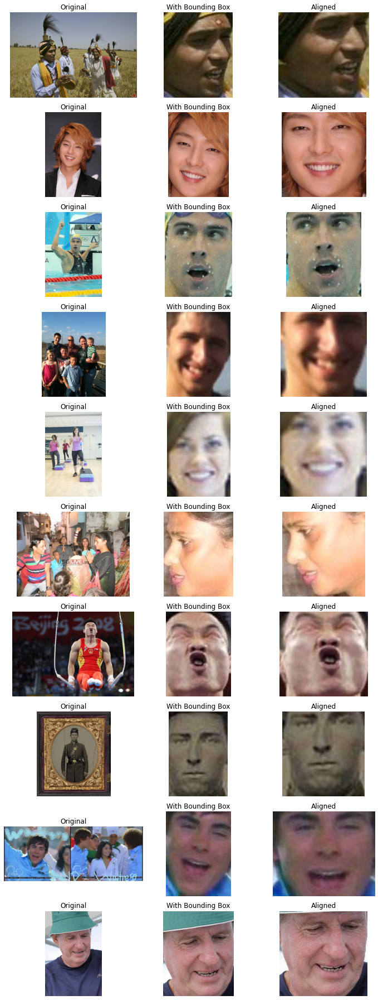

In [44]:
# This line searches through the given 'image_folder' directory and all its subdirectories to find all JPEG files.
# It builds a complete list of file paths for these images which will be used for random sampling.
image_names = [os.path.join(dp, f) for dp, dn, filenames in os.walk(image_folder) for f in filenames if f.endswith('.jpg')]
selected_image_names = random.sample(image_names, 10)  

# Sets up a plotting grid with 10 rows and 3 columns. Each row will display three versions of one of the selected images.
# This visualization helps in comparing the original, bounding-box annotated, and aligned versions of each image. Making sure it's working properly.
fig, axs = plt.subplots(10, 3, figsize=(10, 25))  # Setting up the plot with three columns per row, 10 rows

for idx, image_name in enumerate(selected_image_names):
    # Extracts the filename from the full path to handle file location in different folders correctly.
    relative_path = (image_name.split('/'))[-1]
    output_image_path = os.path.join(output_folder, relative_path)
    transformed_image_path = os.path.join(transformed_folder, relative_path)

    try:
        # Displays the original image in the first column of the current row.
        axs[idx, 0].imshow(Image.open(image_name))
        axs[idx, 0].set_title('Original')
        axs[idx, 0].axis('off')

        # Displays the image with the bounding box (processed state)
        axs[idx, 1].imshow(Image.open(output_image_path))
        axs[idx, 1].set_title('With Bounding Box')
        axs[idx, 1].axis('off')

        # Displays the aligned image (final processed state) 
        axs[idx, 2].imshow(Image.open(transformed_image_path))
        axs[idx, 2].set_title('Aligned')
        axs[idx, 2].axis('off')
    except FileNotFoundError as e:
        # Handles the case where any of the expected image files cannot be found.
        print(f"Error: One of the files could not be found - {e}")

plt.tight_layout()
plt.show()


## Checking Class imbalancy

In [13]:
# Checking if data is imbalanced. 'expression' and 'make-up' are extremly imbalanced in training data.
positive_ratios = data[['pose', 'expression', 'illumination', 'make-up', 'occlusion', 'blur']].mean()
print(f'Positive class ratio for each output feature - training data\n{positive_ratios}\n')

Positive class ratio for each output feature - training data
pose            0.034933
expression      0.024267
illumination    0.203600
make-up         0.010533
occlusion       0.178800
blur            0.188000
dtype: float64



## Correlation Matrix

Correlation matrix for training and validation data can be found below. The reason to check this is to see how correlated those 6 attributes are, and in case of negligible correlation, it's better to define seperate heads for each one instead of having all those in the output layer together. As can be seen in the matix, they actually are close to correlation 0 meaning it will be  very difficult task to predict all 6 together, given the size of the dta and extreme imbalanced dataset, a multi-task with convolutional backbone and dense connection after flattening or GAP seems to be a better choice.

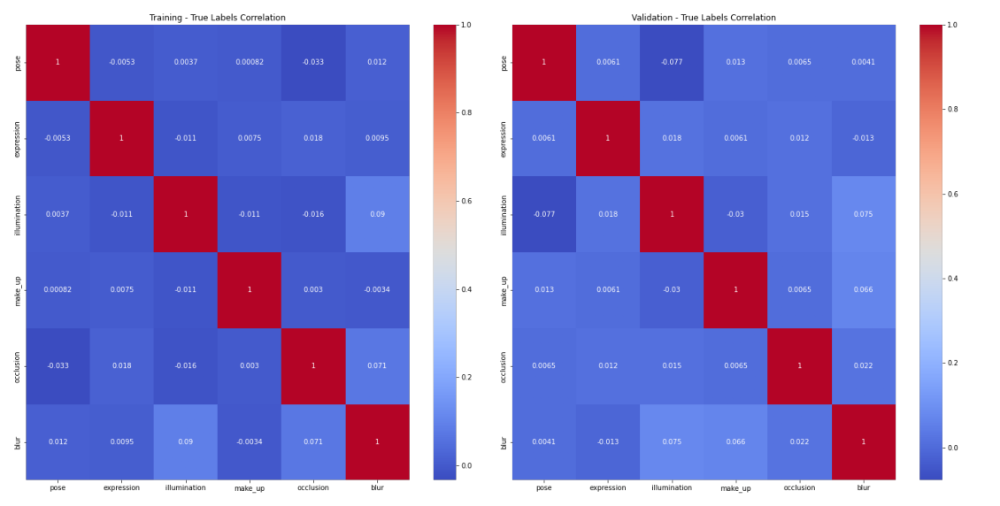

In [40]:
# Read the image file
img = mpimg.imread('Data_correlation_matrix.png')
plt.figure(figsize=(20, 20))  # Adjust the size as needed

# Display the image
plt.imshow(img)
plt.axis('off')  # Hide the axis
plt.show()

# Prediction using pre-trained multi-modal model (CLIP)

I started with a multi-modal pre-trained model to assess how challenging this task is for an advanced multi-modal model based on Vision Transformer (ViT) that is trained on a vast array of image-text pairs. I chose CLIP for its transformer-based architecture and multi-modal capabilities, allowing it to relate the attributes in question to the images.

The following cell predicts the validation data. CLIP’s extensive training enables it to generalize well across various attributes, achieving a high accuracy for 3 of them. The relatively lower accuracy for 'blur' (0.31) indicates that while CLIP is effective at handling general facial attributes, detecting fine-grained details like blur presents more difficulty. This suggests that although CLIP provides a strong starting point, fine-tuning on more specific datasets may be necessary to improve performance for attributes with higher variability or subtlety.

Accuracy for pose = 0.96, expression = 0.63, illumination = 0.71, make-up = 0.86, occlusion = 0.82, and blur = 0.31.

Since I believe despite the imabalanced dataset the task is not too complicated, it doesn't justify to fine-tune large models, for the sake efficiency and performance, I decided to use intuitive simpler models.

In [47]:
# Load pre-trained CLIP model and processor
model_name = 'openai/clip-vit-base-patch32'
model = CLIPModel.from_pretrained(model_name)
processor = CLIPProcessor.from_pretrained(model_name)

# Function to convert generator to dataset
def generator_to_dataset(generator):
    images = []
    labels = []
    for _ in range(len(generator)):
        batch = generator.next()
        for img, label in zip(batch[0], batch[1]):
            images.append(img)
            labels.append(label)
    return images, labels

# Convert generators to datasets
val_images, val_labels = generator_to_dataset(val_gen)

# Define prompts for each label
prompts = {
    "pose": ["normal pose", "large pose"],
    "expression": ["normal expression", "exaggerate expression"],
    "illumination": ["normal illumination", "extreme illumination"],
    "make-up": ["no make-up", "make-up"],
    "occlusion": ["no occlusion", "occlusion"],
    "blur": ["clear", "blur"]
}

# Function to preprocess images and make predictions
def predict(images, label_name):
    text = prompts[label_name]
    inputs = processor(text=text, images=[Image.fromarray((img * 255).astype(np.uint8)) for img in images], return_tensors="pt", padding=True)
    with torch.no_grad():
        outputs = model(**inputs)
    logits_per_image = outputs.logits_per_image
    probs = logits_per_image.softmax(dim=1).cpu().numpy()
    return probs

# Make predictions on validation dataset
predictions = []
batch_size = 32  # Adjust batch size as needed
for i in range(0, len(val_images), batch_size):
    print (f"Processing Batch {i+1} ...")
    batch_images = val_images[i:i + batch_size]
    batch_preds = []
    for label_name in prompts.keys():
        pred = predict(batch_images, label_name)
        batch_preds.append(pred)
    batch_preds = np.array(batch_preds).transpose(1, 0, 2)
    predictions.extend(batch_preds)

# Convert predictions and labels to numpy arrays
predictions = np.array(predictions)
val_labels = np.array(val_labels)

# Compute accuracy for each label
accuracies = []
for i, label_name in enumerate(prompts.keys()):
    acc = accuracy_score(np.argmax(predictions[:, i], axis=1), val_labels[:, i])
    accuracies.append(acc)

# Print accuracies for each label
for idx, label in enumerate(prompts.keys()):
    print(f"Accuracy for {label}: {accuracies[idx]:.2f}")

Processing Batch 1 ...
Processing Batch 33 ...
Processing Batch 65 ...
Processing Batch 97 ...
Processing Batch 129 ...
Processing Batch 161 ...
Processing Batch 193 ...
Processing Batch 225 ...
Processing Batch 257 ...
Processing Batch 289 ...
Processing Batch 321 ...
Processing Batch 353 ...
Processing Batch 385 ...
Processing Batch 417 ...
Processing Batch 449 ...
Processing Batch 481 ...
Processing Batch 513 ...
Processing Batch 545 ...
Processing Batch 577 ...
Processing Batch 609 ...
Processing Batch 641 ...
Processing Batch 673 ...
Processing Batch 705 ...
Processing Batch 737 ...
Processing Batch 769 ...
Processing Batch 801 ...
Processing Batch 833 ...
Processing Batch 865 ...
Processing Batch 897 ...
Processing Batch 929 ...
Processing Batch 961 ...
Processing Batch 993 ...
Processing Batch 1025 ...
Processing Batch 1057 ...
Processing Batch 1089 ...
Processing Batch 1121 ...
Processing Batch 1153 ...
Processing Batch 1185 ...
Processing Batch 1217 ...
Processing Batch 1249 .

# Loss Function

 Since it is a binary classification task for each attribute, Binary Cross-Entropy is a proper choice. But since the dataset is extremly imbalanced for 2 attribiutes, make-up and expression, I chose focal loss to help the imballanced data. 

In [17]:
# Custome objective function, to better handle this imbalanced data
def focal_loss(gamma=2., alpha=0.25):
    def focal_loss_fixed(y_true, y_pred):
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.convert_to_tensor(y_pred, dtype=tf.float32)
        alpha_t = y_true * alpha + (tf.ones_like(y_true) - y_true) * (1 - alpha)
        p_t = y_true * y_pred + (tf.ones_like(y_true) - y_true) * (tf.ones_like(y_true) - y_pred) + tf.keras.backend.epsilon()
        focal_loss_value = - alpha_t * tf.pow((tf.ones_like(y_true) - p_t), gamma) * tf.math.log(p_t)
        return tf.reduce_mean(focal_loss_value)
    return focal_loss_fixed

# Evaluation Metrics


Accuracy is not a good metric on its own when data is imbalanced. High accuracy in imbalanced datasets often means the model is mostly predicting the majority class correctly. This doesn't necessarily mean it performs well on the minority class, which affects precision and recall for the minority class. AUC can better indicate how correct and certain the model's predictions are.

Imbalanced data also impacts precision and recall. When the dataset is heavily imbalanced, even if the model correctly identifies a few positive samples, the number of false positives can be high relative to the number of true positives. This causes precision to be low. Despite having a high AUC, the model might still miss a significant number of true positives because the positive class is underrepresented, leading to a low recall.

Other useful metrics are F1/F2 Score, Balanced Accuracy, and G-Mean (Geometric Mean). However, I only considered accuracy and AUC here, as high AUC is a good enough indicator based on my experience.


In [18]:
# Function to compute metrics using numpy and sklearn
def compute_metrics_np(y_true, y_pred, threshold):
    """
    Compute accuracy and AUC metrics based on true and predicted labels. The predictions are binarized
    using the specified threshold for calculating accuracy. AUC is calculated on the raw predictions.
    
    Args:
        y_true (np.array): Ground truth labels.
        y_pred (np.array): Predicted labels.
        threshold (float): Threshold to binarize predictions.
    
    Returns:
        dict: Dictionary containing accuracy and AUC scores.
    """
    y_true_flat = y_true.flatten()
    y_pred_flat = y_pred.flatten()
    metrics = {}
    y_pred_binary = (y_pred_flat > threshold).astype(int)
    metrics = {
        'accuracy': accuracy_score(y_true_flat, y_pred_binary),
        'auc': roc_auc_score(y_true_flat, y_pred_flat)
    }
    return metrics

# Plot correlation matrix for training and validation data
def plot_correlation_matrix(y_true, y_pred, title, thresholds, model_output_names):
    """
    Plot correlation matrices for true and predicted labels to analyze relationships between different tasks.
    
    Args:
        y_true (dict): Dictionary of true labels for each task.
        y_pred (dict): Dictionary of predicted labels for each task.
        title (str): Title for the plots.
        thresholds (dict): Dictionary of thresholds for binarizing predictions.
        model_output_names (list): List of model output names corresponding to tasks.
    
    Saves:
        Correlation matrices as a PNG file and displays the plot.
    """
    concatenated_true = np.column_stack([y_true[name] for name in model_output_names])
    concatenated_pred = np.column_stack([(y_pred[name] > thresholds[name]).astype(int) for name in model_output_names])
    df_true = pd.DataFrame(concatenated_true, columns=model_output_names)
    df_pred = pd.DataFrame(concatenated_pred, columns=model_output_names)
    corr_true = df_true.corr()
    corr_pred = df_pred.corr()
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    sns.heatmap(corr_true, annot=True, ax=axes[0], cmap='coolwarm')
    axes[0].set_title(f'{title} - True Labels Correlation')
    sns.heatmap(corr_pred, annot=True, ax=axes[1], cmap='coolwarm')
    axes[1].set_title(f'{title} - Predicted Labels Correlation')
    plt.tight_layout()
    plt.savefig(f'{title}_correlation_matrix.png')
    plt.show()

# Function to predict and collect true and predicted labels
def predict_and_collect(generator, model):
    """
    Predicts labels for all images in the generator and collects true and predicted labels.
    
    Args:
        generator (tf.keras.utils.Sequence): Data generator for images.
        model (tf.keras.Model): Trained model to make predictions.
    
    Returns:
        tuple: True labels, predicted labels, and images as numpy arrays.
    """
    all_y_true = {name: [] for name in model.output_names}
    all_y_pred = {name: [] for name in model.output_names}
    images = []
    for _ in range(len(generator)):
        x, y_true = next(generator)
        y_pred = model.predict(x, verbose=0)
        
        for i, name in enumerate(model.output_names):
            all_y_true[name].append(y_true[:, i])
            all_y_pred[name].append(y_pred[i])
        images.append(x)
    
    # Convert lists to numpy arrays
    for name in model.output_names:
        all_y_true[name] = np.concatenate(all_y_true[name], axis=0)
        all_y_pred[name] = np.concatenate(all_y_pred[name], axis=0)
    
    images = np.concatenate(images, axis=0)
    
    return all_y_true, all_y_pred, images

class ModelEvaluator:
    def __init__(self, model_path, train_gen, val_gen):
        """
        Initialize ModelEvaluator with the provided model path, train generator, and validation generator.
        Loads the model, predicts on the datasets, computes metrics, and initializes thresholds.
        
        Args:
            model_path (str): Path to the trained model.
            train_gen (tf.keras.utils.Sequence): Training data generator.
            val_gen (tf.keras.utils.Sequence): Validation data generator.
        """
        self.model_path = model_path
        self.train_gen = train_gen
        self.val_gen = val_gen
        self.custom_objects = {'focal_loss_fixed': focal_loss(gamma=2., alpha=0.25)}
        self.model = load_model(self.model_path, custom_objects=self.custom_objects)
        self.train_y_true, self.train_y_pred, self.train_images = predict_and_collect(self.train_gen, self.model)
        self.val_y_true, self.val_y_pred, self.val_images = predict_and_collect(self.val_gen, self.model)
        self.thresholds = {name: np.mean(self.train_y_pred[name][self.train_y_true[name] == 1]) for name in self.model.output_names}
        self.train_metrics = self.compute_metrics(self.train_y_true, self.train_y_pred)
        self.val_metrics = self.compute_metrics(self.val_y_true, self.val_y_pred)
        self.metrics_df = self.create_metrics_df()
        self.save_metrics()
        self.print_metrics()
        self.identify_performance()
        self.plot_correlation_matrices()

    def compute_metrics(self, y_true, y_pred):
        """
        Compute metrics for each task based on true and predicted labels.
        
        Args:
            y_true (dict): Dictionary of true labels for each task.
            y_pred (dict): Dictionary of predicted labels for each task.
        
        Returns:
            dict: Dictionary of computed metrics for each task.
        """
        return {name: compute_metrics_np(y_true[name], y_pred[name], self.thresholds[name]) for name in self.model.output_names}

    def create_metrics_df(self):
        """
        Create a DataFrame to store metrics for each task and dataset (train and validation).
        
        Returns:
            pd.DataFrame: DataFrame containing metrics for each task and dataset.
        """
        metrics_data = []
        for name in self.model.output_names:
            for metric in self.train_metrics[name].keys():
                metrics_data.append({
                    'Task': name,
                    'Metric': metric,
                    'Dataset': 'Train',
                    'Value': self.train_metrics[name][metric]
                })
                metrics_data.append({
                    'Task': name,
                    'Metric': metric,
                    'Dataset': 'Validation',
                    'Value': self.val_metrics[name][metric]
                })
        df = pd.DataFrame(metrics_data)
        # Pivot the DataFrame to have the desired format
        metrics_df = df.pivot_table(index='Dataset', columns=['Task', 'Metric'], values='Value')
        return metrics_df

    def save_metrics(self):
        """
        Save the metrics DataFrame to a CSV file for further analysis.
        """
        self.metrics_df.to_csv('model_metrics.csv', index=False)

    def print_metrics(self):
        """
        Print the metrics DataFrame to the console for review.
        """
        print(self.metrics_df)

    def identify_performance(self):
        """
        Identify the best and worst performing images for training and validation datasets.
        """
        self.train_good_indices, self.train_bad_indices = {}, {}
        self.val_good_indices, self.val_bad_indices = {}, {}
        for name in self.model.output_names:
            self.train_good_indices[name], self.train_bad_indices[name] = identify_performance(self.train_y_true[name], self.train_y_pred[name], self.thresholds[name])
            self.val_good_indices[name], self.val_bad_indices[name] = identify_performance(self.val_y_true[name], self.val_y_pred[name], self.thresholds[name])

    def plot_correlation_matrices(self):
        """
        Plot correlation matrices for the true and predicted labels in training and validation datasets.
        """
        plot_correlation_matrix(self.train_y_true, self.train_y_pred, 'Training', self.thresholds, self.model.output_names)
        plot_correlation_matrix(self.val_y_true, self.val_y_pred, 'Validation', self.thresholds, self.model.output_names)

    def display_images(self, indices, images, title):
        """
        Display images in a table format with labels on top.
        
        Args:
            indices (list): List of image indices to display.
            images (np.array): Array of images.
            title (str): Title for the images.
        """
        plt.figure(figsize=(20, 10))
        for i, idx in enumerate(indices):
            plt.subplot(1, len(indices), i+1)
            plt.imshow(array_to_img(images[idx]))
            plt.title(title)
            plt.axis('off')
        plt.show()

    def print_top_bottom_images(self):
        """
        Print and display the top 5 best and worst performing images for each task in training and validation datasets.
        """
        print("\nTop 5 Best Performing Images (Train):\n")
        for name in self.model.output_names:
            print(f"Task: {name}")
            print("Best Images:")
            self.display_images(self.train_good_indices[name], self.train_images, f"Train Best - {name}")
            print("Worst Images:")
            self.display_images(self.train_bad_indices[name], self.train_images, f"Train Worst - {name}")

        print("\nTop 5 Best Performing Images (Validation):\n")
        for name in self.model.output_names:
            print(f"Task: {name}")
            print("Best Images:")
            self.display_images(self.val_good_indices[name], self.val_images, f"Val Best - {name}")
            print("Worst Images:")
            self.display_images(self.val_bad_indices[name], self.val_images, f"Val Worst - {name}")


# Models

Given that the six metrics (pose, blur, expression, etc.) have almost zero correlation, a multi-task learning approach with multiple heads is the most suitable. This approach allows each task to have its own output head, enabling the model to specialize in the unique features of each metric without interference from unrelated tasks. This specialization is particularly beneficial for handling the imbalanced metrics, as it allows for tailored loss functions and class weights to be applied, improving the model's ability to correctly classify minority classes, although I used focal-loss for all attributes.

In contrast, using a single backbone with an output layer containing six neurons would not provide the same level of task-specific specialization, potentially leading to poorer performance due to the lack of correlation between tasks. The multi-task learning approach ensures that each head can independently optimize for its respective metric, leading to better overall performance and more effective handling of class imbalances.

For the backbone, I investigated two choices. First, I tried DeepFace as a pre-trained backbone (with frozen parameters), followed by a flatten layer and a dense layer with one output neuron for each head. After training the model, I switched the backbone to an attention model, and the loss improved significantly. This indicated that the task is solvable with a simpler backbone, so I did not pursue further hyper-parameter tuning with the pre-trained backbone.

The choice of a spatial attention block is justified because it allows the model to focus on specific regions within the face images that are most relevant to each task, such as eyes for expression or certain facial landmarks for pose. Spatial attention enhances the model's ability to capture fine-grained spatial details, which is crucial for accurately classifying these metrics. However, a channel-wise attention block could also be beneficial as it would allow the model to emphasize the most important feature maps across the channels, potentially improving performance by focusing on the most discriminative features. If computational resources permit, experimenting with both types of attention blocks could help determine which one yields better results for each specific task. The connection on top of the attention model is similar to that of custom multi-task DeepFace, but the validation loss reaches a lower value, making it my top model.

The attention model leverages attention blocks and convolutional layers to effectively extract and focus on important features from facial images. The applied CNN before attention is to augment the feature stack with more channels, making rich feature stacks. Pooling is used mostly for dimension reduction but also to build a deep coarse feature stack while applying more and more filter sizes. Kernel sizes are kept low to avoid adding unnecessary parameters since these deep coarse features already have great context information. The attention blocks use filters of sizes 1x1, 2x2, and 3x3, capturing varied spatial information and enhancing feature representation. By concatenating these outputs, the model benefits from a richer feature set. The convolutional layers are configured with 32 and 64 filters, balancing depth and computational efficiency, ensuring the model can learn complex patterns without excessive computational load. The learning rate is set at 0.001 for the Adam optimizer, balancing convergence speed and stability, facilitating effective training without overshooting optimal parameters.

The use of focal loss with gamma set to 2.0 and alpha set to 0.25 is crucial for handling class imbalance, making the model focus more on hard-to-classify examples. The network depth, which includes two attention blocks followed by convolutional layers and max pooling, ensures sufficient complexity to capture nuanced features while preventing overfitting. Each task's output layer employs a sigmoid activation function for binary classification, aligning with the need to predict distinct attributes like pose, expression, illumination, make-up, occlusion, and blur. 

In [19]:
# Define a multi-task learning model
def multi_task_model():
    """
    Constructs a multi-task model using convolutional neural networks (CNNs) to predict multiple
    attributes from facial images. The model outputs six attributes: pose, expression, illumination,
    make-up, occlusion, and blur.

    Returns:
        model (tf.keras.Model): Compiled Keras model for multi-task learning.
    """
    inputs = Input(shape=(224, 224, 3))
    # Initial convolutional layer with 32 filters
    x = Conv2D(32, (4, 4), activation='relu', padding='same')(inputs)
    x_conv = Conv2D(64, (2, 2), activation='relu', padding='same')(x)
    # Max pooling layer to downsample the feature maps
    x = MaxPooling2D(2, 2)(x_conv)
    x = Conv2D(64, (1, 1), activation='relu', padding='same')(x)
    x = Flatten()(x)

    # Output layers for each task, using sigmoid activation for binary classification
    pose_output = Dense(1, activation='sigmoid', name='pose')(x)
    expression_output = Dense(1, activation='sigmoid', name='expression')(x)
    illumination_output = Dense(1, activation='sigmoid', name='illumination')(x)
    make_up_output = Dense(1, activation='sigmoid', name='make_up')(x)
    occlusion_output = Dense(1, activation='sigmoid', name='occlusion')(x)
    blur_output = Dense(1, activation='sigmoid', name='blur')(x)

    # Compile the model with Adam optimizer and focal loss
    model = Model(inputs=inputs, outputs=[pose_output, expression_output, illumination_output, make_up_output, occlusion_output, blur_output])
    model.compile(optimizer=Adam(learning_rate=0.005), 
                  loss=focal_loss(gamma=2., alpha=0.25), 
                  metrics=['accuracy'])
    return model

# Define an attention block to improve feature extraction
def attention_block(inputs, filters):
    """
    Creates an attention block consisting of multiple convolutional layers with different
    kernel sizes to capture varied spatial information. Outputs are concatenated and passed
    through an additional convolutional layer.

    Args:
        inputs (tf.Tensor): Input tensor.
        filters (int): Number of filters for convolutional layers.
    
    Returns:
        tf.Tensor: Output tensor after attention block processing.
    """
    g1 = Conv2D(filters, (1, 1), padding='same', activation='relu')(inputs)
    g1 = MaxPooling2D(pool_size=(2, 2))(g1)
    
    g2 = Conv2D(filters, (2, 2), padding='same', activation='relu')(inputs)
    g2 = MaxPooling2D(pool_size=(2, 2))(g2)
    
    g3 = Conv2D(filters, (3, 3), padding='same', activation='relu')(inputs)
    g3 = MaxPooling2D(pool_size=(2, 2))(g3)
    
    # Concatenate the outputs of the convolutional layers
    merged = Concatenate()([g1, g2, g3])
    
    # Additional convolutional layer for merged output
    g4 = Conv2D(filters, (1, 1), padding='same', activation='relu')(merged)
    
    return g4

# Function to build the attention-based model
def attention_model(input_shape=(224, 224, 3)):
    """
    Constructs a multi-task learning model incorporating attention mechanisms to enhance
    feature extraction. The model predicts six attributes from facial images.

    Args:
        input_shape (tuple): Shape of the input images.

    Returns:
        model (tf.keras.Model): Compiled Keras model with attention mechanisms.
    """
    inputs = Input(shape=input_shape)
    
    # Attention block 1
    attention1 = attention_block(inputs, 16)
    
    # Convolutional block 1
    conv1 = Conv2D(32, (2, 2), padding='same', activation='relu')(attention1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    
    # Attention block 2
    attention2 = attention_block(pool1, 32)
    
    # Convolutional block 2
    conv2 = Conv2D(64, (2, 2), padding='same', activation='relu')(attention2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    
    # Flatten the output
    gap = Flatten()(pool2)
    
    # Fully connected layers for each task with sigmoid activation
    pose_output = Dense(1, activation='sigmoid', name='pose')(gap)
    expression_output = Dense(1, activation='sigmoid', name='expression')(gap)
    illumination_output = Dense(1, activation='sigmoid', name='illumination')(gap)
    make_up_output = Dense(1, activation='sigmoid', name='make_up')(gap)
    occlusion_output = Dense(1, activation='sigmoid', name='occlusion')(gap)
    blur_output = Dense(1, activation='sigmoid', name='blur')(gap)
    
    model = Model(inputs=inputs, outputs=[pose_output, expression_output, illumination_output, make_up_output, occlusion_output, blur_output])
    
    # Compile the model with Adam optimizer and focal loss
    model.compile(optimizer=Adam(learning_rate=0.001), 
                  loss=focal_loss(gamma=2., alpha=0.25), 
                  metrics=['accuracy'])

    return model

# Function to get embedding from DeepFace
def get_embedding(img_path):
    """
    Extracts embeddings for a given image using DeepFace with VGG-Face model.

    Args:
        img_path (str): Path to the image file.

    Returns:
        np.array: Embedding vector for the image.
    """
    embeddings = DeepFace.represent(img_path=img_path, model_name="VGG-Face", enforce_detection=False)
    return np.array(embeddings[0]['embedding'])

# Define a model using DeepFace embeddings
def deepFace_model(input_shape):
    """
    Constructs a multi-task model using DeepFace embeddings as input. The model processes the embeddings
    and predicts six facial attributes.

    Args:
        input_shape (tuple): Shape of the input embeddings.

    Returns:
        model (tf.keras.Model): Compiled Keras model using DeepFace embeddings.
    """
    input_layer = Input(shape=(50176, 3))
    x = Reshape((224, 224, 3))(input_layer)
    x = Conv2D(128, (2, 2), padding='same', activation='relu')(x)
    x = AveragePooling2D(pool_size=(4, 4))(x)
    x = Conv2D(256, (2, 2), padding='same', activation='relu')(x)
    x = AveragePooling2D(pool_size=(4, 4))(x)
    
    gap = Flatten()(x)
    
    # Fully connected layers for each task with sigmoid activation
    pose_output = Dense(1, activation='sigmoid', name='pose')(gap)
    expression_output = Dense(1, activation='sigmoid', name='expression')(gap)
    illumination_output = Dense(1, activation='sigmoid', name='illumination')(gap)
    make_up_output = Dense(1, activation='sigmoid', name='make_up')(gap)
    occlusion_output = Dense(1, activation='sigmoid', name='occlusion')(gap)
    blur_output = Dense(1, activation='sigmoid', name='blur')(gap)
    
    model = Model(inputs=input_layer, outputs=[pose_output, expression_output, illumination_output, make_up_output, occlusion_output, blur_output])
    
    # Compile the model with Adam optimizer and focal loss
    model.compile(optimizer=Adam(learning_rate=0.001), 
                  loss=focal_loss(gamma=2., alpha=0.25), 
                  metrics=['accuracy'])
    return model


# Training and Results

### Multi-task Attention Model Without Data Augmention

In [61]:
model = attention_model()
# or load model
#model = load_model('best_att_no_aug_new.h5', custom_objects={'focal_loss_fixed': focal_loss(gamma=2., alpha=0.25)}) 
#tf.keras.backend.set_value(model.optimizer.learning_rate, 0.0001)

checkpoint = ModelCheckpoint('best_att_no_aug_new.h5',  monitor='val_loss', save_best_only=True, mode='min')
model.summary()

history = model.fit(train_gen, validation_data=val_gen, epochs=500, callbacks=[checkpoint])

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_50 (Conv2D)          (None, 224, 224, 16)         64        ['input_6[0][0]']             
                                                                                                  
 conv2d_51 (Conv2D)          (None, 224, 224, 16)         208       ['input_6[0][0]']             
                                                                                                  
 conv2d_52 (Conv2D)          (None, 224, 224, 16)         448       ['input_6[0][0]']             
                                                                                            

/usr/lib/python3/dist-packages/keras/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


2986/2986 [==============================] - 131s 44ms/step - loss: 0.1813 - pose_loss: 0.0302 - expression_loss: 0.0302 - illumination_loss: 0.0302 - make_up_loss: 0.0302 - occlusion_loss: 0.0302 - blur_loss: 0.0302 - pose_accuracy: 0.8926 - expression_accuracy: 0.8926 - illumination_accuracy: 0.8926 - make_up_accuracy: 0.8926 - occlusion_accuracy: 0.8926 - blur_accuracy: 0.8926 - val_loss: 0.1899 - val_pose_loss: 0.0316 - val_expression_loss: 0.0317 - val_illumination_loss: 0.0316 - val_make_up_loss: 0.0317 - val_occlusion_loss: 0.0317 - val_blur_loss: 0.0316 - val_pose_accuracy: 0.8893 - val_expression_accuracy: 0.8893 - val_illumination_accuracy: 0.8893 - val_make_up_accuracy: 0.8893 - val_occlusion_accuracy: 0.8893 - val_blur_accuracy: 0.8893
Epoch 2/500
 327/2986 [==>...........................] - ETA: 1:46 - loss: 0.1721 - pose_loss: 0.0287 - expression_loss: 0.0287 - illumination_loss: 0.0287 - make_up_loss: 0.0287 - occlusion_loss: 0.0287 - blur_loss: 0.0287 - pose_accuracy: 0

KeyboardInterrupt: 

### Multi-task Attention Model With Data Augmention

In [20]:
Att_Aug_model = attention_model()
# or load model
#Att_Aug_model = load_model('best_Attmodel_with_Aug.h5', custom_objects={'focal_loss_fixed': focal_loss(gamma=2., alpha=0.25)}) 
#tf.keras.backend.set_value(Att_Aug_model.optimizer.learning_rate, 0.0001)

checkpoint = ModelCheckpoint('best_Attmodel_with_Aug.h5',  monitor='val_loss', save_best_only=True, mode='min')
Att_Aug_model.summary()

history = Att_Aug_model.fit(combined_train_gen, validation_data=val_gen, epochs=500, callbacks=[checkpoint])


Epoch 1/500
100/100 [==============================] - 36s 313ms/step - loss: 0.2294 - pose_loss: 0.0382 - expression_loss: 0.0382 - illumination_loss: 0.0382 - make_up_loss: 0.0382 - occlusion_loss: 0.0382 - blur_loss: 0.0382 - pose_accuracy: 0.8640 - expression_accuracy: 0.8640 - illumination_accuracy: 0.8640 - make_up_accuracy: 0.8640 - occlusion_accuracy: 0.8640 - blur_accuracy: 0.8640 - val_loss: 0.1720 - val_pose_loss: 0.0287 - val_expression_loss: 0.0287 - val_illumination_loss: 0.0287 - val_make_up_loss: 0.0287 - val_occlusion_loss: 0.0287 - val_blur_loss: 0.0287 - val_pose_accuracy: 0.8917 - val_expression_accuracy: 0.8917 - val_illumination_accuracy: 0.8917 - val_make_up_accuracy: 0.8917 - val_occlusion_accuracy: 0.8917 - val_blur_accuracy: 0.8917
Epoch 2/500
100/100 [==============================] - 31s 316ms/step - loss: 0.2290 - pose_loss: 0.0382 - expression_loss: 0.0382 - illumination_loss: 0.0382 - make_up_loss: 0.0382 - occlusion_loss: 0.0382 - blur_loss: 0.0382 - pos

KeyboardInterrupt: 

# Deep Face

Even though it improved the performance comparing with tradition CNN, the val_loss could not decrease lower than 0.32. Multi-task attention model reaches less than 0.3. 
Understood. Here’s the table with training and validation losses placed next to each other for each metric:

### Performance Comparison

| Metric              | Training Loss | Validation Loss |
|---------------------|---------------|-----------------|
| Overall Loss        | 0.1670        | 0.1965          |
| Pose Loss           | 0.0278        | 0.0327          |
| Expression Loss     | 0.0278        | 0.0327          |
| Illumination Loss   | 0.0278        | 0.0327          |
| Make Up Loss        | 0.0278        | 0.0327          |
| Occlusion Loss      | 0.0278        | 0.0328          |
| Blur Loss           | 0.0278        | 0.0327          |


Computing other metrics and fine-tuning was so time-consuming that I decided to stop the process for now.

In [55]:
x_sample, _ = next(train_gen)
sample_img = x_sample[0]  # Use the first image in the batch

# Save the sample image temporarily to get its path
sample_img_path = 'temp_img.jpg'
tf.keras.preprocessing.image.save_img(sample_img_path, sample_img)

# Generate the embedding for the sample image
sample_embedding = get_embedding(sample_img_path)
input_shape = (sample_embedding.shape[0],)

# Build the model with the shape of embeddings
model = deepFace_model(input_shape=input_shape)

# Print model summary
model.summary()

train_gen.batch_size = 16
val_gen.batch_size = 16
# Train the model
checkpoint = ModelCheckpoint('best_deep_face.h5', save_best_only=False)
history = model.fit(train_gen, validation_data=val_gen, epochs=500,  callbacks=[checkpoint])

Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_8 (InputLayer)        [(None, 50176, 3)]           0         []                            
                                                                                                  
 reshape_7 (Reshape)         (None, 224, 224, 3)          0         ['input_8[0][0]']             
                                                                                                  
 conv2d_30 (Conv2D)          (None, 224, 224, 128)        1664      ['reshape_7[0][0]']           
                                                                                                  
 average_pooling2d_14 (Aver  (None, 56, 56, 128)          0         ['conv2d_30[0][0]']           
 agePooling2D)                                                                              

KeyboardInterrupt: 

# Results and Comparison

### Results Without Augmentation

Task            blur           expression           illumination            \
Metric      accuracy       auc   accuracy       auc     accuracy       auc   
Dataset                                                                      
Train       0.778694  0.796185   0.688819  0.648081     0.716359  0.715521   
Validation  0.770718  0.770557   0.677486  0.702315     0.723066  0.728746   

Task        make_up           occlusion                pose            
Metric     accuracy       auc  accuracy       auc  accuracy       auc  
Dataset                                                                
Train       0.81283  0.738208  0.727078  0.717163  0.770119  0.732076  
Validation  0.79489  0.649409  0.735497  0.737232  0.751381  0.747029  


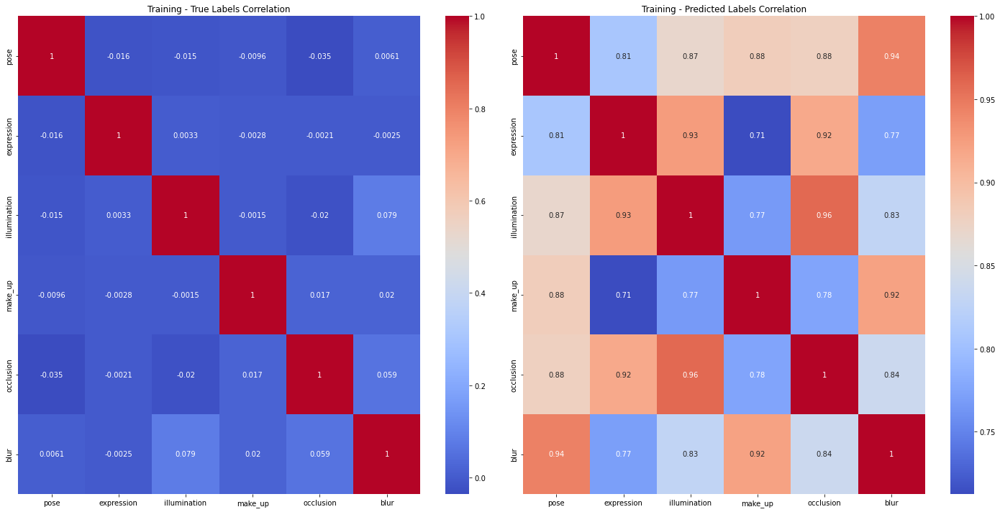

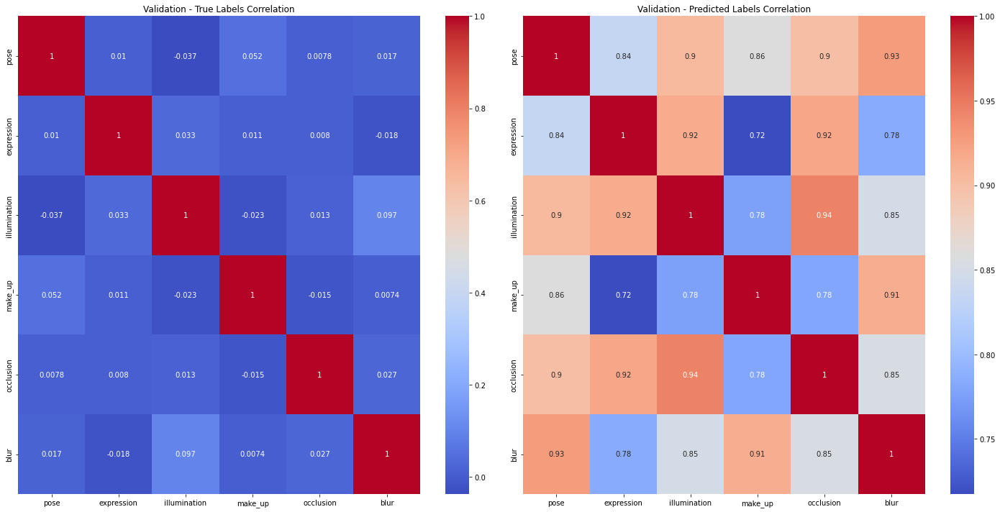


Top 5 Best Performing Images (Train):

Task: pose
Best Images:


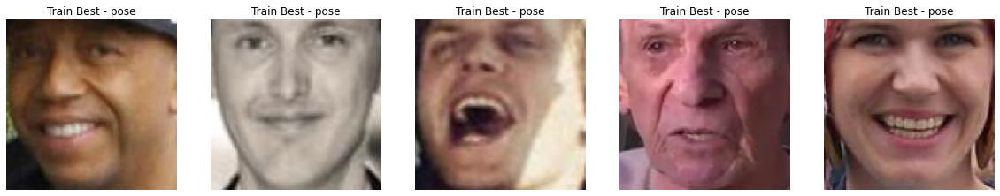

Worst Images:


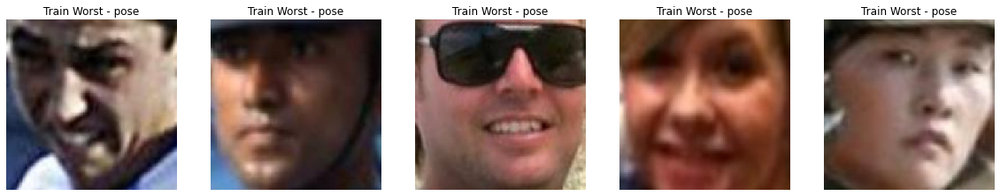

Task: expression
Best Images:


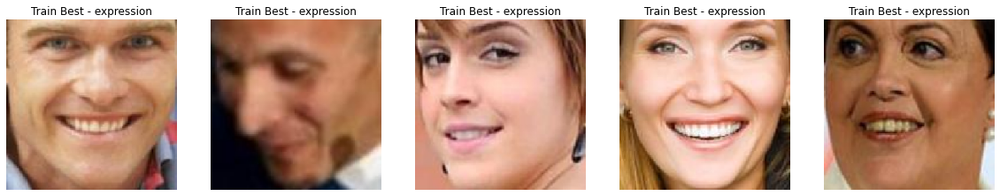

Worst Images:


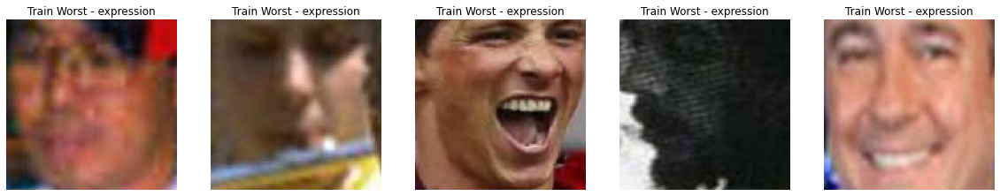

Task: illumination
Best Images:


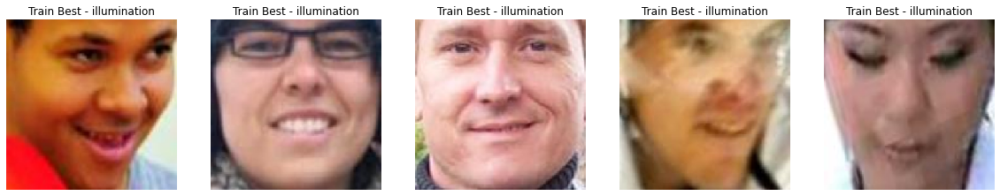

Worst Images:


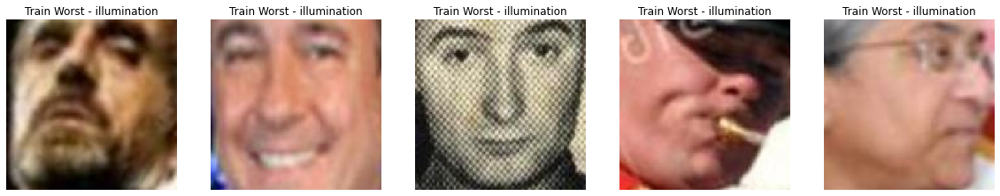

Task: make_up
Best Images:


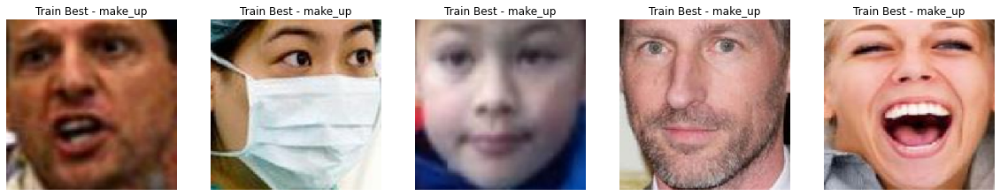

Worst Images:


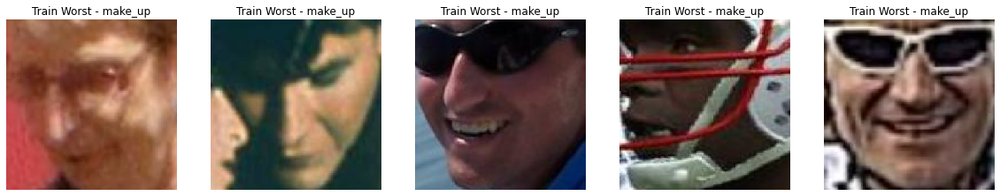

Task: occlusion
Best Images:


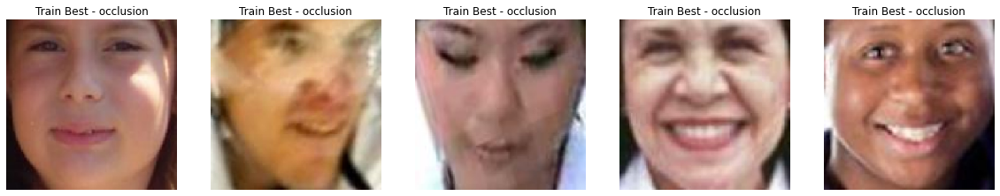

Worst Images:


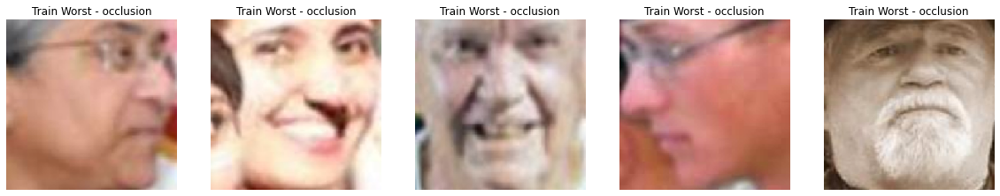

Task: blur
Best Images:


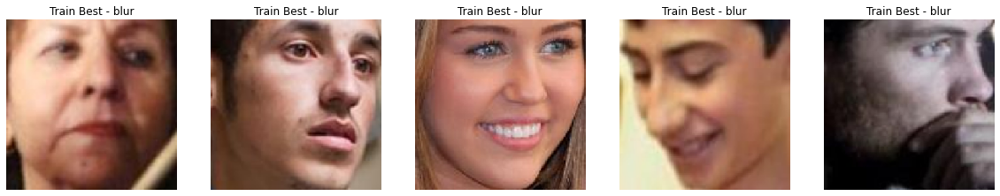

Worst Images:


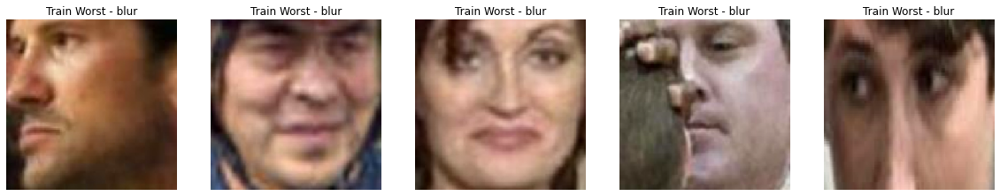


Top 5 Best Performing Images (Validation):

Task: pose
Best Images:


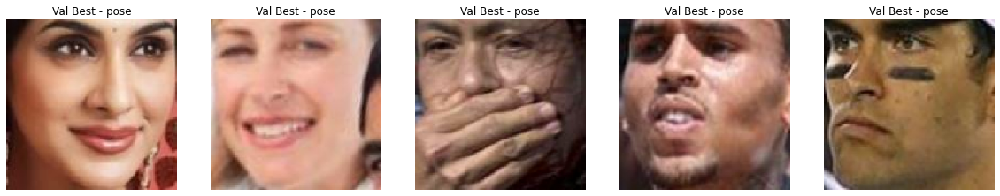

Worst Images:


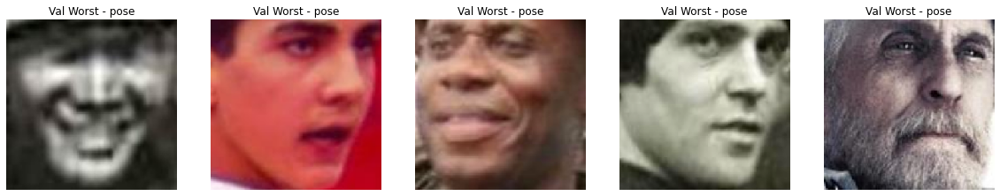

Task: expression
Best Images:


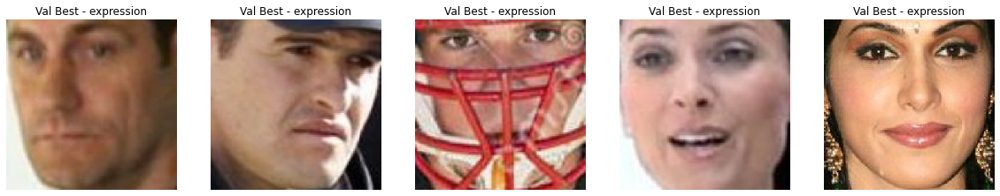

Worst Images:


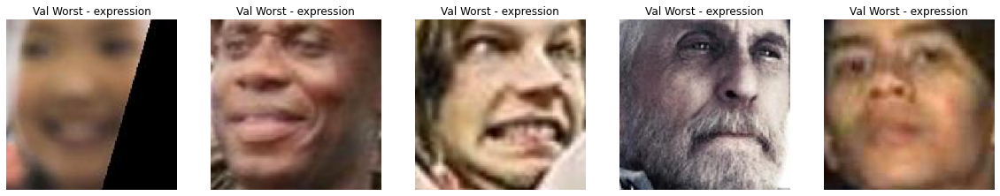

Task: illumination
Best Images:


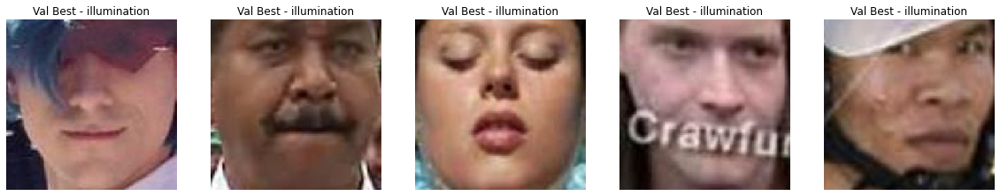

Worst Images:


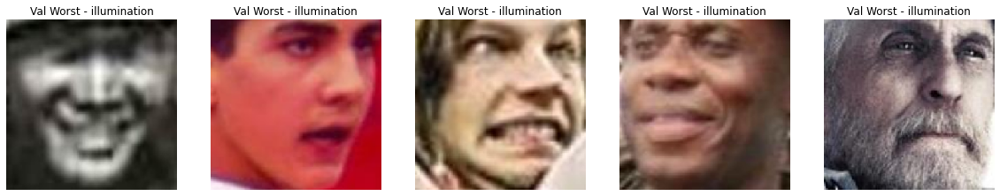

Task: make_up
Best Images:


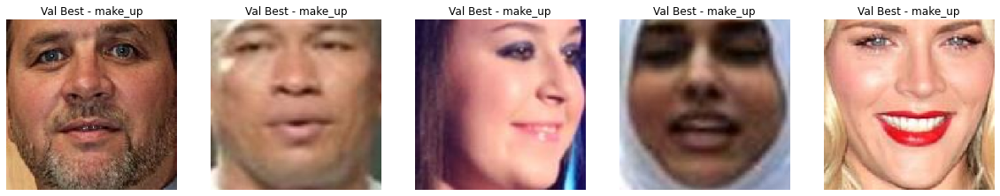

Worst Images:


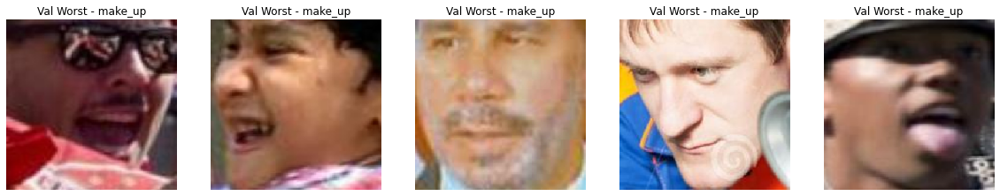

Task: occlusion
Best Images:


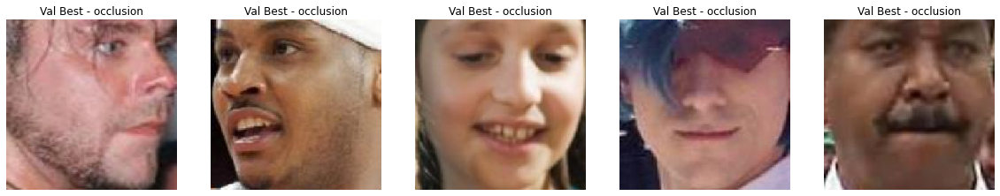

Worst Images:


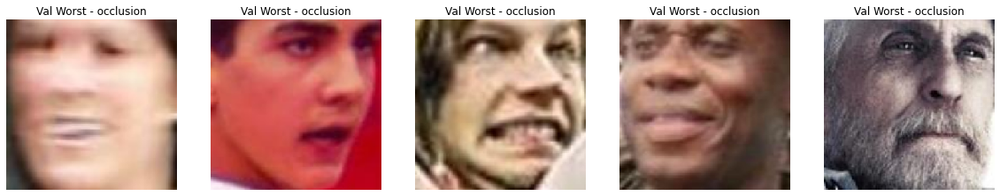

Task: blur
Best Images:


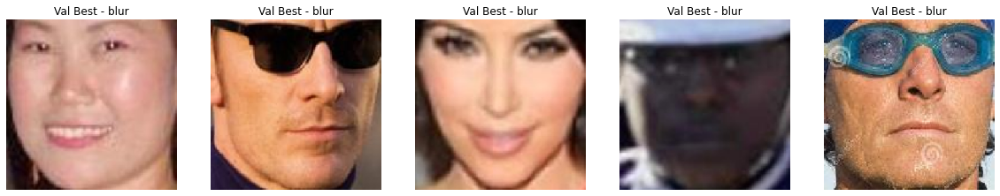

Worst Images:


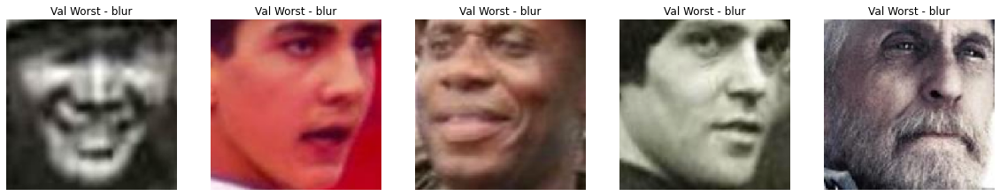

In [26]:
model_path = 'best_att_no_aug_new.h5'
evaluator = ModelEvaluator(model_path, train_gen, val_gen)#, test_gen)
evaluator.print_top_bottom_images()

### Results With Augmentation

Task            blur           expression           illumination            \
Metric      accuracy       auc   accuracy       auc     accuracy       auc   
Dataset                                                                      
Train       0.820155  0.841501   0.806945  0.750178     0.813927  0.850266   
Validation  0.817771  0.821780   0.795934  0.725237     0.797440  0.836430   

Task         make_up           occlusion                pose            
Metric      accuracy       auc  accuracy       auc  accuracy       auc  
Dataset                                                                 
Train       0.799774  0.743448  0.764484  0.774313  0.751651  0.722441  
Validation  0.798946  0.842548  0.756024  0.760482  0.756777  0.782391  


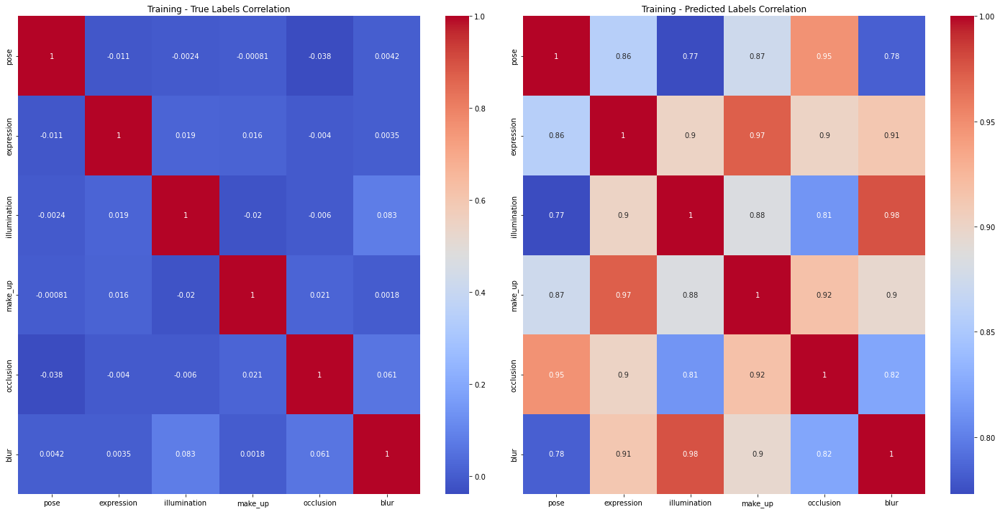

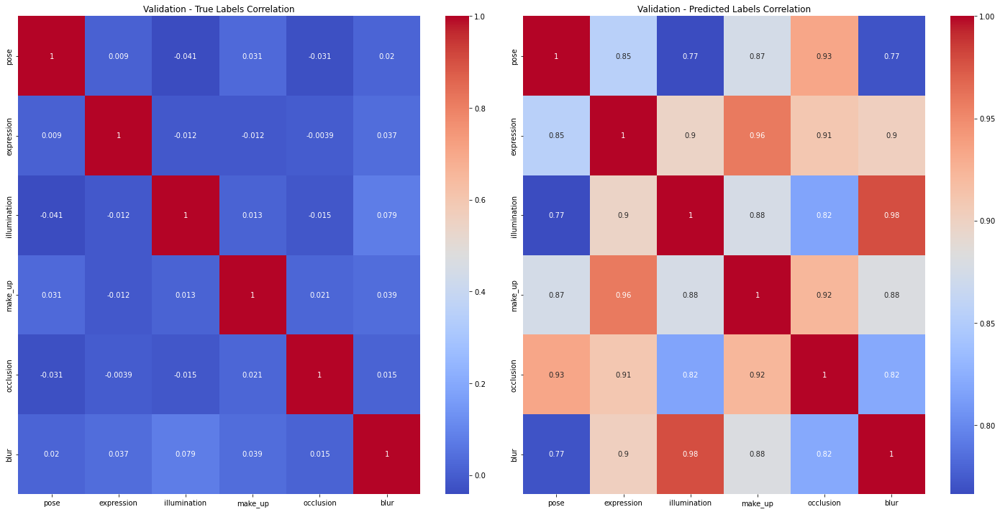


Top 5 Best Performing Images (Train):

Task: pose
Best Images:


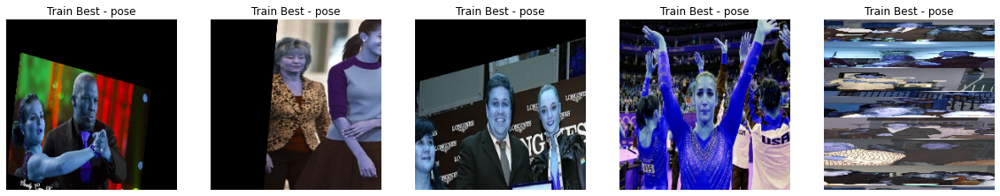

Worst Images:


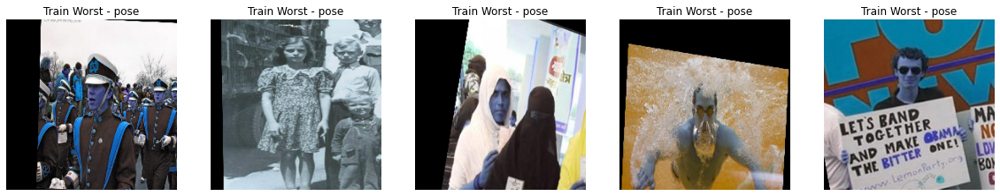

Task: expression
Best Images:


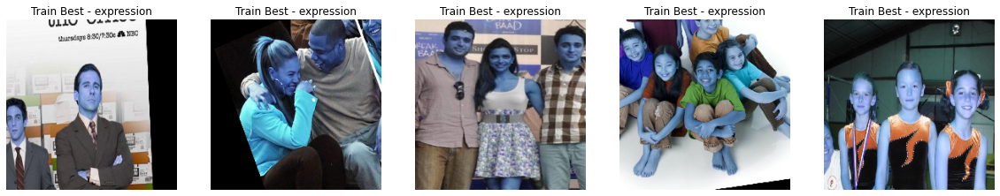

Worst Images:


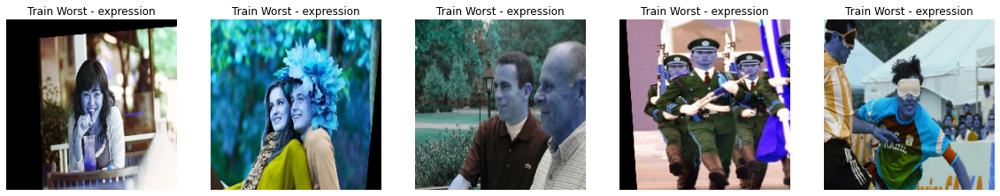

Task: illumination
Best Images:


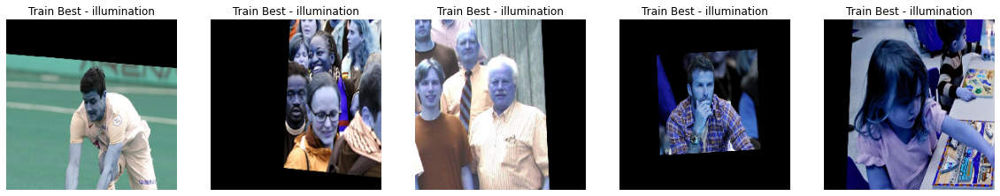

Worst Images:


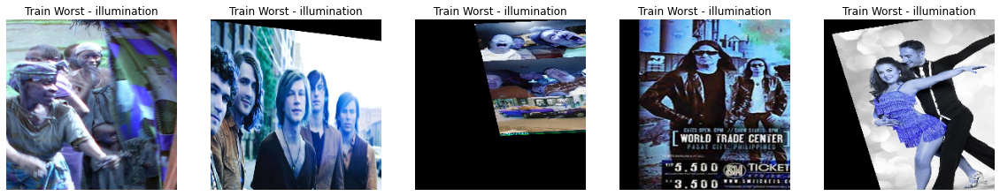

Task: make_up
Best Images:


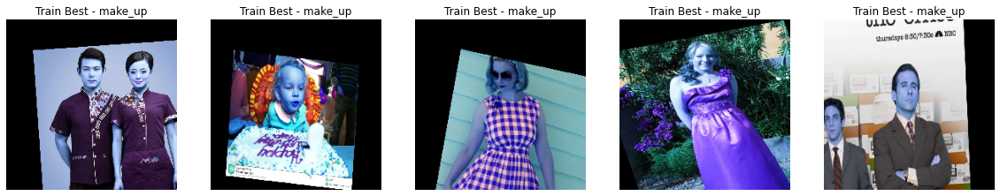

Worst Images:


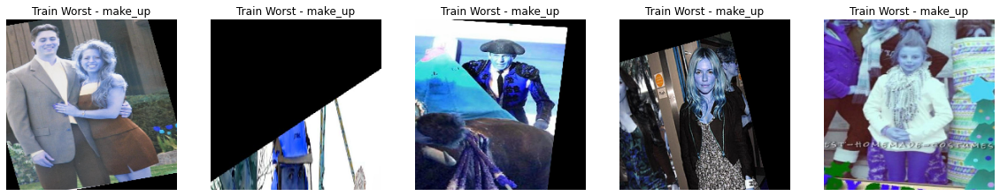

Task: occlusion
Best Images:


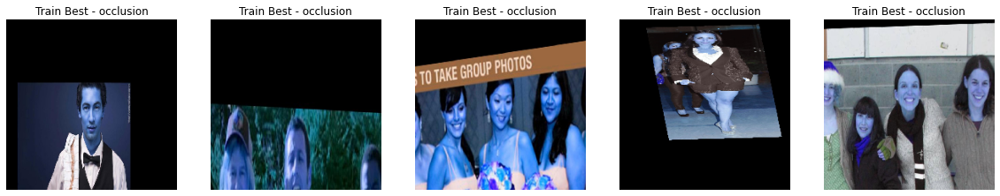

Worst Images:


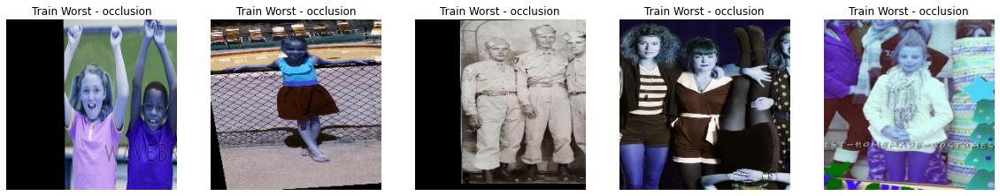

Task: blur
Best Images:


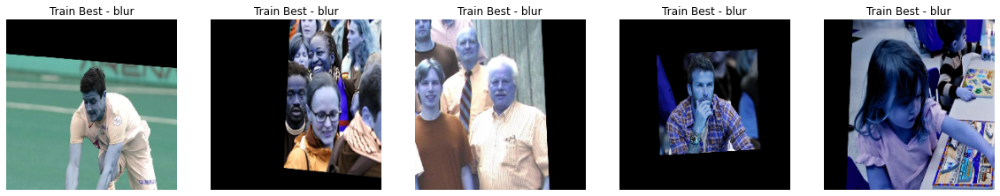

Worst Images:


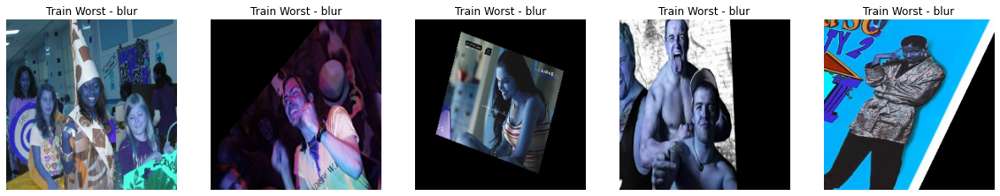


Top 5 Best Performing Images (Validation):

Task: pose
Best Images:


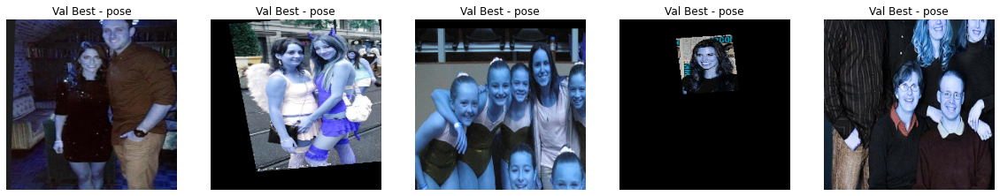

Worst Images:


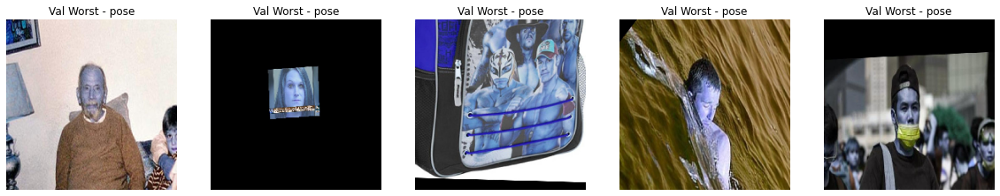

Task: expression
Best Images:


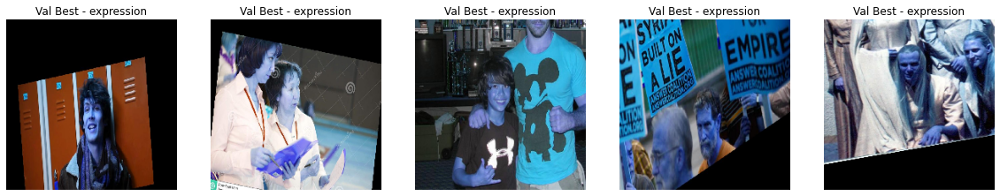

Worst Images:


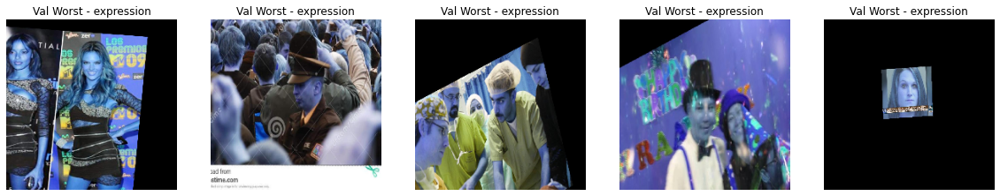

Task: illumination
Best Images:


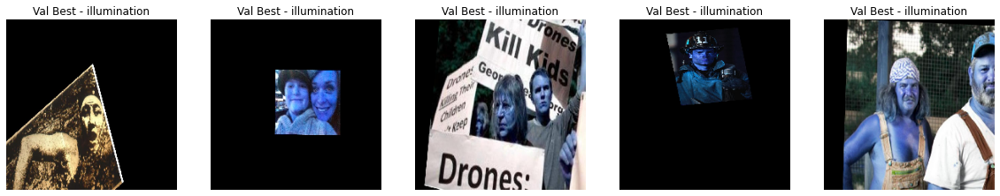

Worst Images:


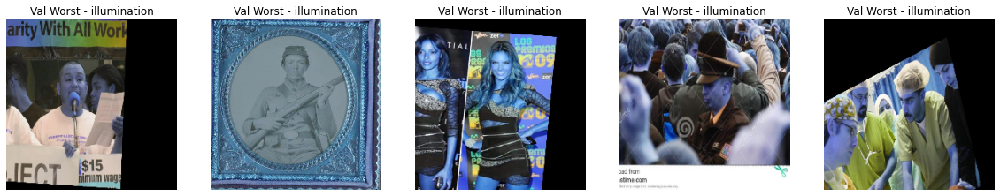

Task: make_up
Best Images:


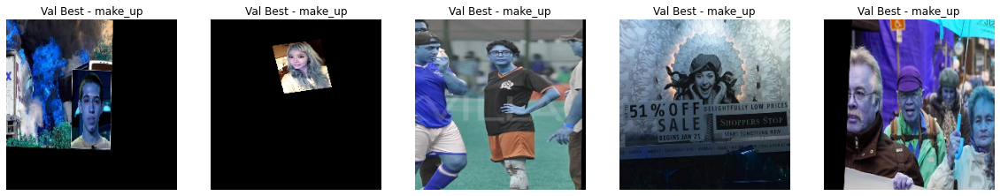

Worst Images:


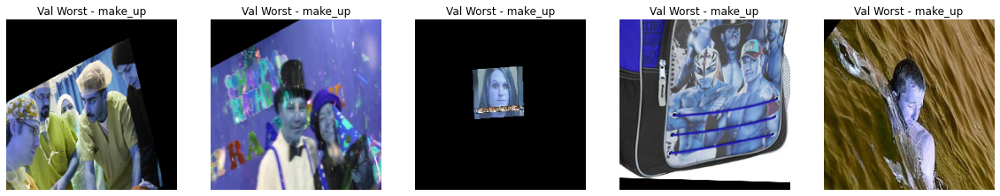

Task: occlusion
Best Images:


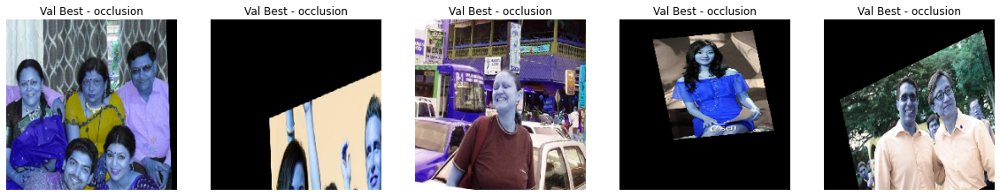

Worst Images:


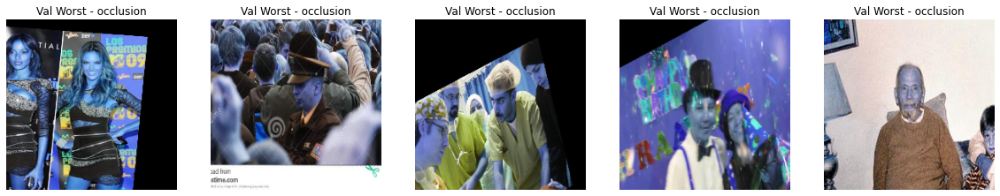

Task: blur
Best Images:


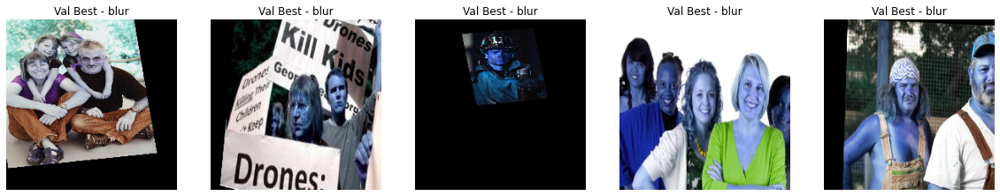

Worst Images:


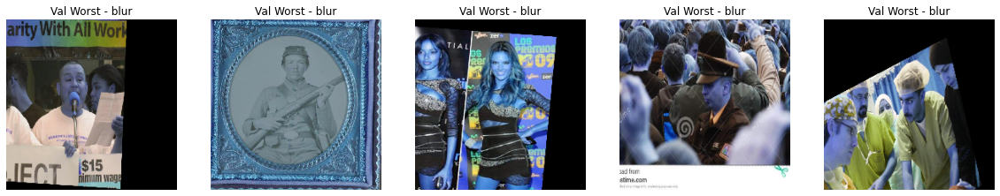

In [30]:
# Attention Model
model_path = 'best_Attmodel_with_Aug.h5'

train_gen.batch_size , val_gen.batch_size = 64 , 64
evaluator = ModelEvaluator(model_path, train_gen, val_gen)
evaluator.print_top_bottom_images()


The results from training and validation demonstrate that incorporating data augmentation significantly improves model performance across various tasks. This improvement is evident in both accuracy and AUC metrics for most attributes. The augmented dataset shows superior performance compared to the non-augmented dataset, indicating the effectiveness of augmentation techniques in enhancing the model's generalization capability.

### Training Performance

| Task         | Metric       | No Augmentation | With Augmentation |
|--------------|--------------|-----------------|-------------------|
| Blur         | Accuracy     | 0.778694        | 0.820155          |
|              | AUC          | 0.796185        | 0.841501          |
| Expression   | Accuracy     | 0.688819        | 0.806945          |
|              | AUC          | 0.648081        | 0.750178          |
| Illumination | Accuracy     | 0.716359        | 0.813927          |
|              | AUC          | 0.715521        | 0.850266          |
| Make_up      | Accuracy     | 0.812830        | 0.799774          |
|              | AUC          | 0.738208        | 0.743448          |
| Occlusion    | Accuracy     | 0.727078        | 0.764484          |
|              | AUC          | 0.717163        | 0.774313          |
| Pose         | Accuracy     | 0.770119        | 0.751651          |
|              | AUC          | 0.732076        | 0.722441          |

### Validation Performance

| Task         | Metric       | No Augmentation | With Augmentation |
|--------------|--------------|-----------------|-------------------|
| Blur         | Accuracy     | 0.770718        | 0.817771          |
|              | AUC          | 0.770557        | 0.821780          |
| Expression   | Accuracy     | 0.677486        | 0.795934          |
|              | AUC          | 0.702315        | 0.725237          |
| Illumination | Accuracy     | 0.723066        | 0.797440          |
|              | AUC          | 0.728746        | 0.836430          |
| Make_up      | Accuracy     | 0.794890        | 0.798946          |
|              | AUC          | 0.649409        | 0.842548          |
| Occlusion    | Accuracy     | 0.735497        | 0.756024          |
|              | AUC          | 0.737232        | 0.760482          |
| Pose         | Accuracy     | 0.751381        | 0.756777          |
|              | AUC          | 0.747029        | 0.782391          |

### Conclusion

The augmentation process, which included techniques such as zooming and horizontal flipping, resulted in a richer and more varied dataset, significantly enhancing model performance. This was particularly evident in the improved accuracy and AUC scores for most of the tasks, demonstrating the model's improved ability to generalize and accurately predict facial attributes. Notably, this augmented data surpassed all baseline models with a simple network and traditional convolutional architectures.

The simple network architecture without multitasking and traditional convolutional layers could not achieve the same performance levels as the multi-task model enhanced with data augmentation. The attention-based model, leveraging spatial attention blocks, outperformed these baselines, underscoring the importance of specialized architectures and augmentation strategies in complex tasks such as facial attribute prediction.

In conclusion, the integration of data augmentation and a specialized multi-task learning architecture provides a robust framework for improving model performance in predicting facial attributes. This approach not only addresses class imbalance but also ensures that the model learns to generalize well across various tasks, achieving higher accuracy and AUC scores compared to non-augmented datasets and simpler models.